# Evidence Tree - Evidence based clustering

In [2]:
# basic imports
import numpy as np
import pandas as pd
import itertools
import warnings

In [3]:
#dataset imports
from sklearn.datasets import load_boston, load_breast_cancer, load_iris
from sklearn.utils.random import sample_without_replacement

In [4]:
#plotting imports
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [5]:
plt.style.use('bmh')

## Expected procedure:
1) Make all columns descrete by binnig

2) Calculate Evidence factor as ln(evidence / non-evidence)

3) Calculate Polychoric Correlation between variables ( cos(180/(srt(AC/BD)+1)) where AC/BD are odds ration of 2x2 matrix)

4) Define weighted polychoric corelation (one vs rest for each pair of variable) and score each variable

5) Make binary split on positive - negative scores on each variable

6) Iterate on partition of data made until stopping criteria is met

7) Add negative ciretria at each node to reject its presence in data

** Ideal expectation: Tree should build more on positive side of any variable. Or splitting needs to be redefined. **

### Stopping criteria:
 * Granularity : evidences factor in each node
 * Complexity  : Weighted evidenc factor in tree hierarchy( higher the better and less complex)
 * Grouping    : Support and Lift for each combination from root to leaf
 * Buckets     : No of bucket / categories to be available at each step (cannot be less than 3)
 * Reusage     : Restrict the reusage of variable for making split ( curently its non restricted and this needs to be evaluated)
 * 
 * Other       : Width / depth /
 
### Outcomes:
 * Evidence score   : The more the new observation goes down the tree greater is the evidence score ( This is to be used in conjunction with cluster of data which they belong)
 * Evidence distance: The whole tree nodes lie on the distance from the root node with distance being weighted evidence factor from previous node.
 * Clustering       : Similar evidence buckets can be said as cluster ( similarity yet to be decided) / or score cutoff can be used to defince cluster as in hierarchichal clustering
 * Classifier       : Evidently with each node we can attach class weigths and socre for probability socres / logitstic regression on each leaf bucket of tree
 * Regression       : Regression on each subset/ bucket of tree leaf nodes
 * Association      : Every combination from root to leaf can defined as and assoicatied group in data
 * Variabel score   : Variable importance scoring based on no of usages and and weigthed evidence factor 
 

In [6]:
def get_data(dataname):
    
    if dataname == 'iris':
        data = load_iris()
    elif dataname == 'boston':
        data = load_boston()
    elif dataname == 'cancer':
        data = load_breast_cancer()
    df  = pd.concat([pd.DataFrame(data.data),pd.DataFrame(data.target)],axis = 1)
    names = [i for i in data.feature_names]
    names.append('target')
    df.columns = names
    print(df.head())
    print(df.describe())
    return df




In [7]:
df = get_data('boston')


      CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD    TAX  \
0  0.00632  18.0   2.31   0.0  0.538  6.575  65.2  4.0900  1.0  296.0   
1  0.02731   0.0   7.07   0.0  0.469  6.421  78.9  4.9671  2.0  242.0   
2  0.02729   0.0   7.07   0.0  0.469  7.185  61.1  4.9671  2.0  242.0   
3  0.03237   0.0   2.18   0.0  0.458  6.998  45.8  6.0622  3.0  222.0   
4  0.06905   0.0   2.18   0.0  0.458  7.147  54.2  6.0622  3.0  222.0   

   PTRATIO       B  LSTAT  target  
0     15.3  396.90   4.98    24.0  
1     17.8  396.90   9.14    21.6  
2     17.8  392.83   4.03    34.7  
3     18.7  394.63   2.94    33.4  
4     18.7  396.90   5.33    36.2  
             CRIM          ZN       INDUS        CHAS         NOX          RM  \
count  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000   
mean     3.593761   11.363636   11.136779    0.069170    0.554695    6.284634   
std      8.596783   23.322453    6.860353    0.253994    0.115878    0.702617   
min      0.006320    

In [8]:
def ef_cat(arr, return_array = False, verbose=0):
    unq = np.unique(arr)
    tot_events = arr.shape[0]
    ref = []
    hist = []
    for i in unq:
        events = np.sum(arr == i)
        hist.append(events)
        non_events = tot_events - events
        ref.append(np.log(events/non_events))
    if verbose>0:
        print('Data has uniques:\n {} \nand respective Evidence Factor:\n {}Net EF: {}'.format(unq,ref,np.sum(ref)))
    if return_array:
        return np.array(ref), arr, unq, np.array(hist)
    return np.sum(ref)

def evidence_criterias(criteria, hist, events):
    
    if criteria == 'base':
        return np.any(hist <= 5)
    elif criteria == 'twocr':
        return np.any(hist <= 5) and np.any(hist <= 0.05*events)
    elif criteria == 'max10': # still need to think on this
        hist_max = np.max(hist)
        uquart,lquart = np.percentile(hist, [75,25])
        print(hist_max,uquart,lquart,(hist_max-uquart),1.1*uquart)
        if (hist_max-uquart) > 1.1*uquart:
            return False
        else:
            return True
    elif criteria == 'iqrlow':
        uquart,lquart = np.percentile(hist, [75,25])
        print(np.min(hist),uquart,lquart,(lquart - 0.5*(uquart-lquart)))
        if np.min(hist) < (lquart - 0.5*(uquart-lquart)):
            return False
        else:
            return True
    elif criteria == 'iqrhigh':
        uquart,lquart = np.percentile(hist, [75,25])
        print(np.max(hist),uquart,lquart,(uquart + 1.5*(uquart-lquart)))
        if np.max(hist) > (uquart + 1.5*(uquart-lquart)):
            return False
        else:
            return True
    elif criteria == 'iqrbi' or criteria == 'biiqr':
        uquart, lquart = np.percentile(hist, [75,25])
        print(uquart,lquart,np.min(hist),(lquart - 0.5*(uquart-lquart)),np.max(hist),(uquart + 1.5*(uquart-lquart)),np.min(hist) <= (lquart - 0.5*(uquart-lquart)),np.max(hist) >= (uquart + 1.5*(uquart-lquart)))
        if np.min(hist) <= (lquart - 0.5*(uquart-lquart)) and np.max(hist) >= (uquart + 1.5*(uquart-lquart)):
            return False
        else:
            return True

    

def ef_num(arr, bins=20, check_evidence=True, evidence_criteria = 'base', return_array = False, verbose=0):
    
    # basic data storage
    arr = arr.reshape(-1,1)
    tot_events = arr.shape[0]
    ref = []
    bin_flag = True
    
    # calculating first histogram
    hist, unq = np.histogram(arr, bins=bins)
    
    if isinstance(bins,str):
        bin_flag = False
    else:
        bins = bins-1
    
    # checking conditions if behaviour of histogram for further usages
    # checking for binary condition, if binary then evalute using categorical function
    if np.unique(hist).shape[0] == 3 and bin and bins != 2 :

        if verbose > 0:
            print('Evident number of Bins: {}'.format(bins))
        return ef_cat(arr, return_array=return_array, verbose=verbose)
    
    #checking for evidences when number of bins are given
    elif check_evidence and bin_flag:
        while evidence_criterias(evidence_criteria, hist, tot_events) :
            bins -= 1
            if verbose >2:
                print('Reducing bins to get proper evidences! Old Histogram:{} \n New bin size:{}'.format(hist,bins))
            hist,unq = np.histogram(arr, bins=bins)
        if bins == 1:
            bins = 2
        if verbose > 0:
            print('Evident number of Bins: {}'.format(bins))   
    
    # checking evidences when standard methods provided by numpy is used
    elif check_evidence and not bin_flag:
        if verbose > 2:
            print('Before checking histogram:\nHist: {} \nUnique splits: {}'.format(hist,unq))
        while np.any(hist == 0):
            # print("O indexes:", np.where(hist == 0))
            idx = np.where(hist == 0)[0]
            # print('Hist: {}, binstart: {}'.format(hist[idx],unq[idx]))
            unq = np.delete(unq,idx)
            hist = np.delete(hist,idx)
        hist, unq = np.histogram(arr,bins=unq)
        if verbose > 2:
            print('After checking histogram:\nHist: {} \nUnique splits: {}'.format(hist,unq))
        if verbose > 0:
            print('Evident number of Bins: {}'.format(len(unq)-1))
            
    # do notihing default for fallbacks
    else:
        if verbose>2:
            print('Hist: {} \n Unique splits: {}'.format(hist,unq))
        if verbose > 0:
            print('Evident number of Bins: {}'.format(len(unq)-1))
    
    # following if a very bad hack to overcome digitize problem... might be changed in future...
    # redoing binnig based on unq edges
    arr = np.digitize(arr, bins=unq, right=False)
    # recalculating bincounts
    hist = np.bincount(arr.flatten())
    hist = hist[hist != 0]
    
#     print('{}:{}'.format(hist.shape[0],np.unique(arr).shape[0]))
    assert hist.shape[0] == np.unique(arr).shape[0]
    
    # calculating relative evidence factor (ref)
    for val in hist:
        events = val
        non_events = tot_events - events
        if events == 0:
            ref.append(np.log(1e-3/tot_events))
        else:
            ref.append(np.log(events/non_events))
    
    #asserting the number or relative evidence factor (ref) == number of bins in histogram
    assert len(ref) == len(hist)
    
    if verbose > 1:
        print('Bins on data are:\n {} \nRespective Sizes:\n {}\nRespective WOE:\n {}\nNet WOE: {}'.format(unq,hist,ref,np.sum(ref)))
    
    # returning array of histogram bins
    if return_array:
        return np.array(ref), arr, unq, hist
    
    # default return value
    return np.sum(ref)
    
    
    

In [8]:
len(ef_num(df.iloc[:,7].values, bins='sturges',verbose=1,return_array=True))

Evident number of Bins: 10


4

In [9]:
len(ef_num(df.iloc[:,7].values, bins= 30, check_evidence=False,verbose=2,return_array=True))

Evident number of Bins: 30
Bins on data are:
 [  1.1296       1.49616333   1.86272667   2.22929      2.59585333
   2.96241667   3.32898      3.69554333   4.06210667   4.42867      4.79523333
   5.16179667   5.52836      5.89492333   6.26148667   6.62805      6.99461333
   7.36117667   7.72774      8.09430333   8.46086667   8.82743      9.19399333
   9.56055667   9.92712     10.29368333  10.66024667  11.02681     11.39337333
  11.75993667  12.1265    ] 
Respective Sizes:
 [29 57 64 49 39 23 32 28 21 23 14 24 12 14 20  8 14  4 13  2  4  4  3  2  2
  1]
Respective WOE:
 [-2.8002206609018674, -2.0639716199077043, -1.9324267987180261, -2.2328630927835782, -2.4827676115392507, -3.044522437723423, -2.6954714188953499, -2.8374062223162522, -3.1396264532140603, -3.044522437723423, -3.5594213868770495, -2.9998902837026549, -3.717628867399922, -3.5594213868770495, -3.1904763503465028, -4.1311585353448175, -3.5594213868770495, -4.832305758571839, -3.6355598165811536, -5.5294290875114234, -4.832305

4

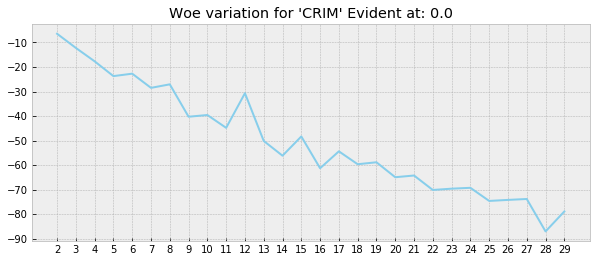

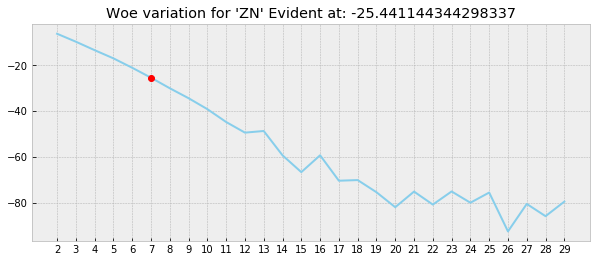

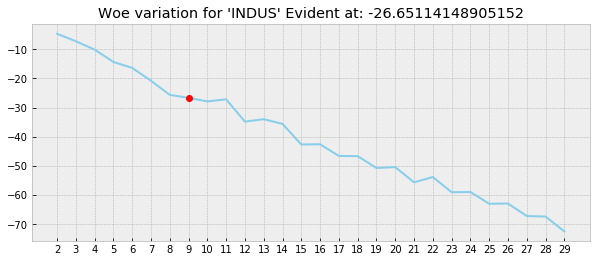

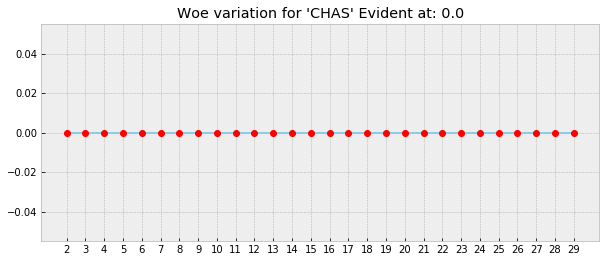

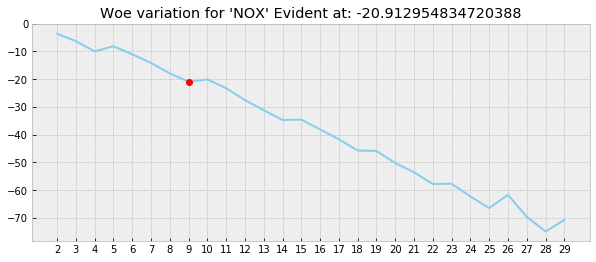

...

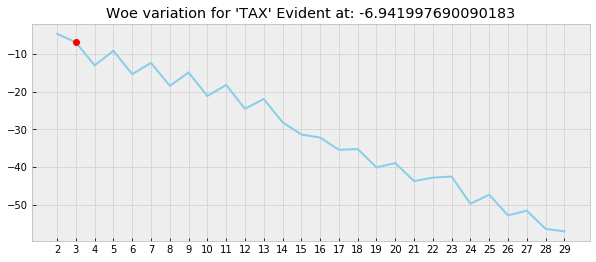

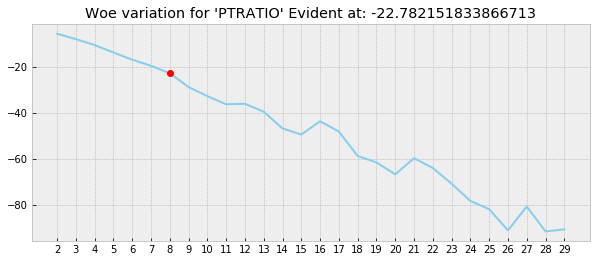

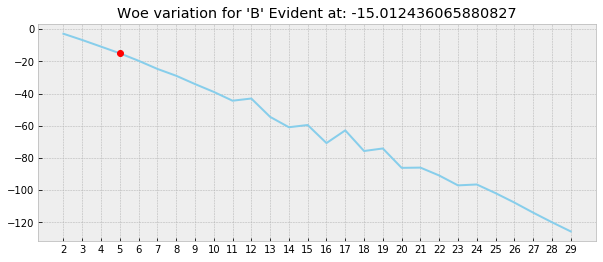

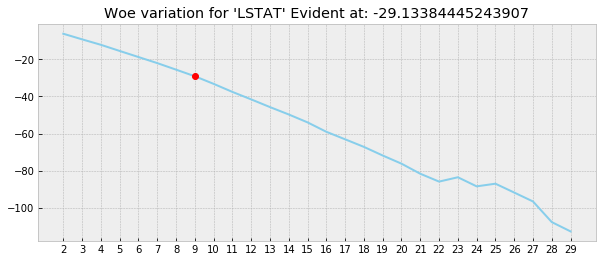

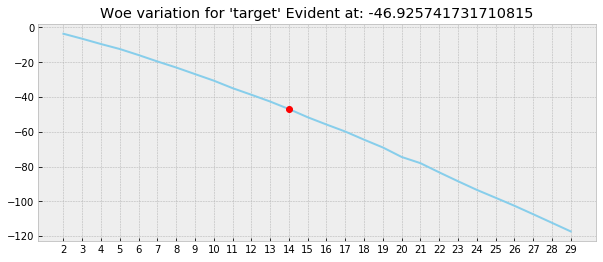

In [10]:

for i in range(df.shape[1]):
    woes = []
    ind = []
    for k in reversed(range(2,30)):
        woes.append(ef_num(df.iloc[:,i].values,bins=k,check_evidence=False))
        ind.append(k)
    ind = np.array(ind)
    woes = np.array(woes)
    evident = ef_num(df.iloc[:,i].values,bins=30)
    func = np.vectorize(lambda x: x == evident)
    plt.figure(figsize=(10,4))
    plt.plot(ind,woes,color='skyblue')
    plt.plot(ind[func(woes)], woes[func(woes)], 'ro')
    plt.xticks(ind)
    plt.title('Woe variation for \'{}\' Evident at: {}'.format(df.columns[i], evident))
    plt.show()

In [11]:
def plt_individual_woe(arr, bin_range=(1,30)):
    min_bin = bin_range[0]
    max_bin = bin_range[1]
    woes = []
    ind = []
    n_plt = len([i for i in range(min_bin,max_bin+1)])
    subplts = int(np.floor(np.sqrt(n_plt)))*int(np.ceil(np.sqrt(n_plt)))
    if subplts == n_plt:
        nr = int(np.floor(np.sqrt(n_plt)))
        nc = int(np.ceil(np.sqrt(n_plt)))
    else:
        nr = int(np.floor(np.sqrt(n_plt))) + 1
        nc = int(np.ceil(np.sqrt(n_plt)))
    plt.figure(figsize=(20,17))
    for k in reversed(range(min_bin,max_bin+1)):
        woe_, _, _, woe_arr = ef_num(arr, bins=k, check_evidence=False, return_array=True) 
        woes.append(woe_)
        ind.append(k)
        plt.subplot(nr, nc, max_bin+1-k)
        plt.subplots_adjust(wspace = 0.3,hspace=0.4)
        if k <15:
            plt.xticks(np.arange(0,k+1,1))
        elif k > 24 :
            plt.xticks(np.arange(0,k+1,3))
            plt.tick_params('x',labelsize=8.5)
        else:
            plt.xticks(np.arange(0,k+1,2))
        plt.plot(woe_arr,'-ro')
        plt.title('Plot {} Bins'.format(k))
    plt.suptitle("Individual WOE plots for each Bin size!",fontsize=16)
    plt.show()

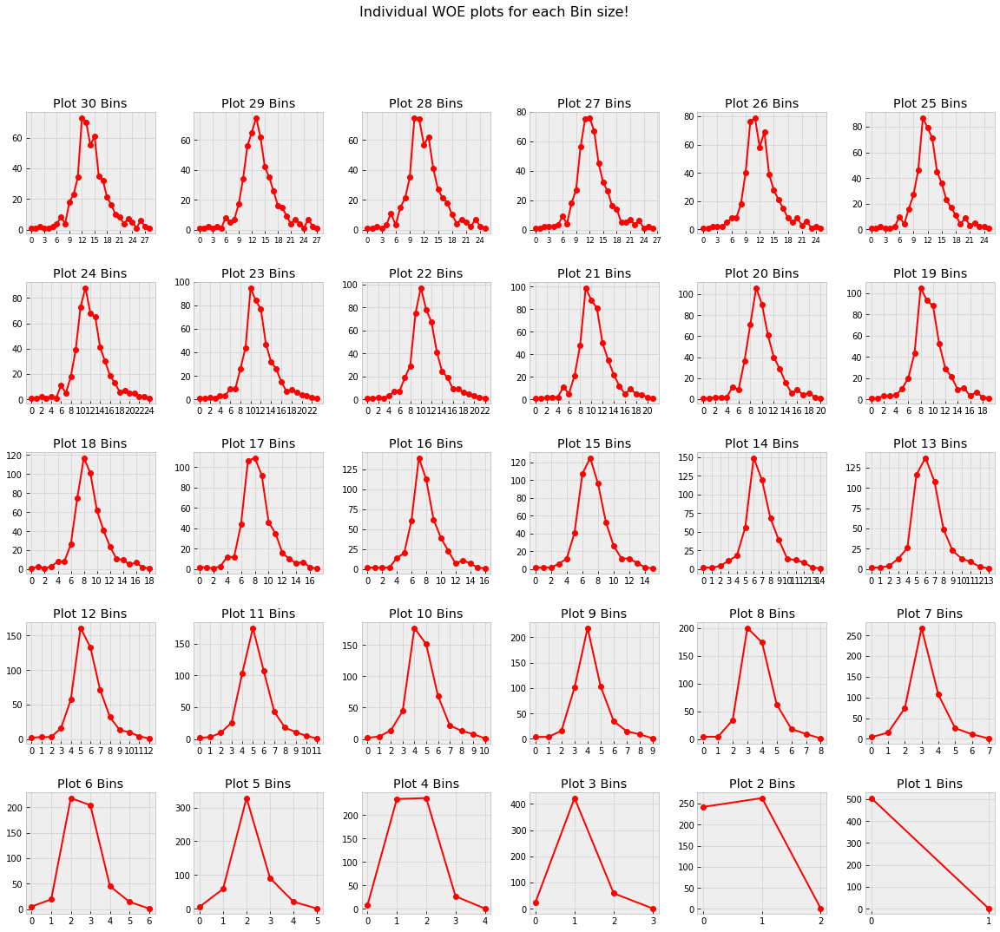

In [12]:
plt.style.use('bmh')
plt_individual_woe(df.iloc[:,5].values,bin_range=(1,30))

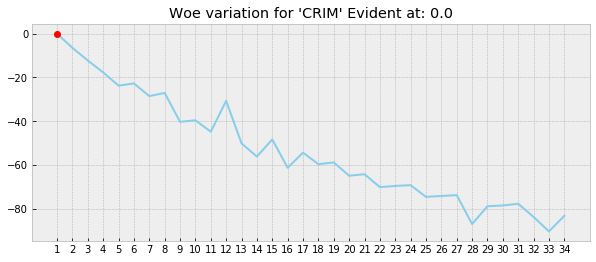

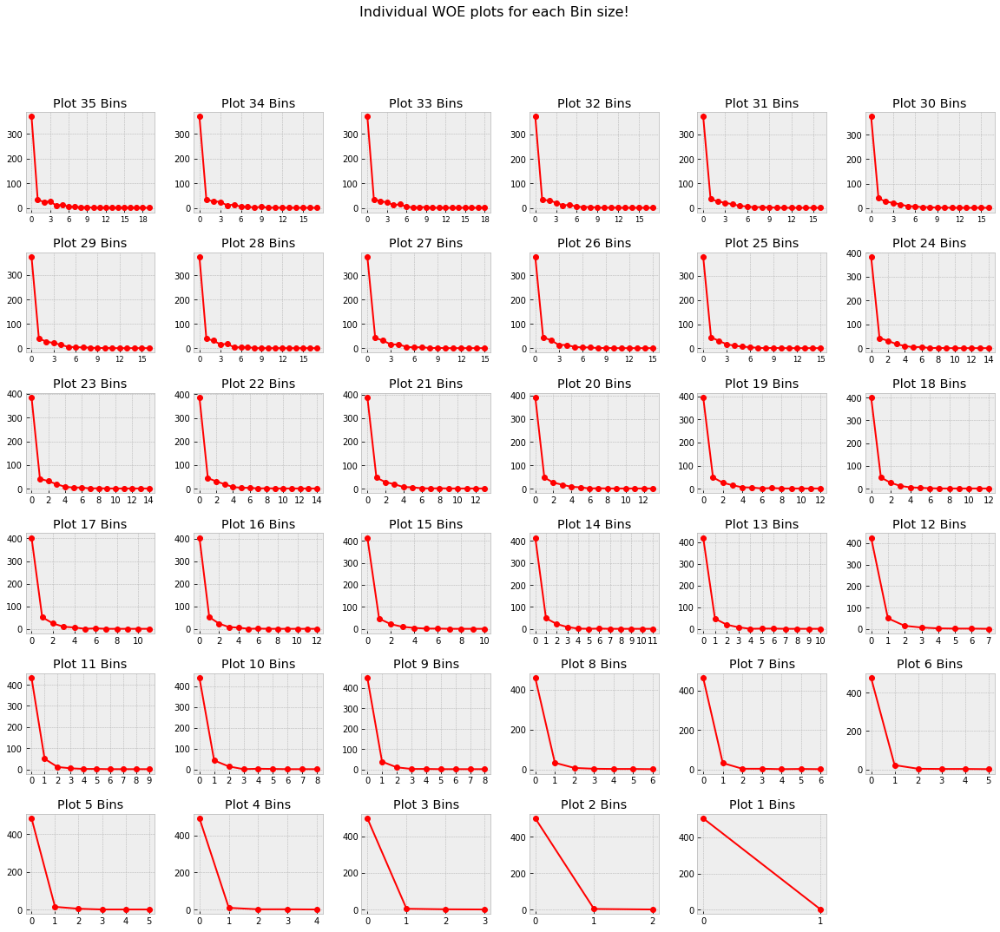

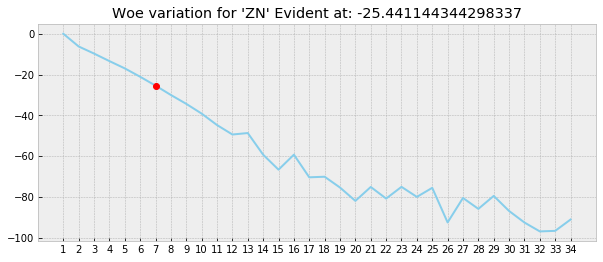

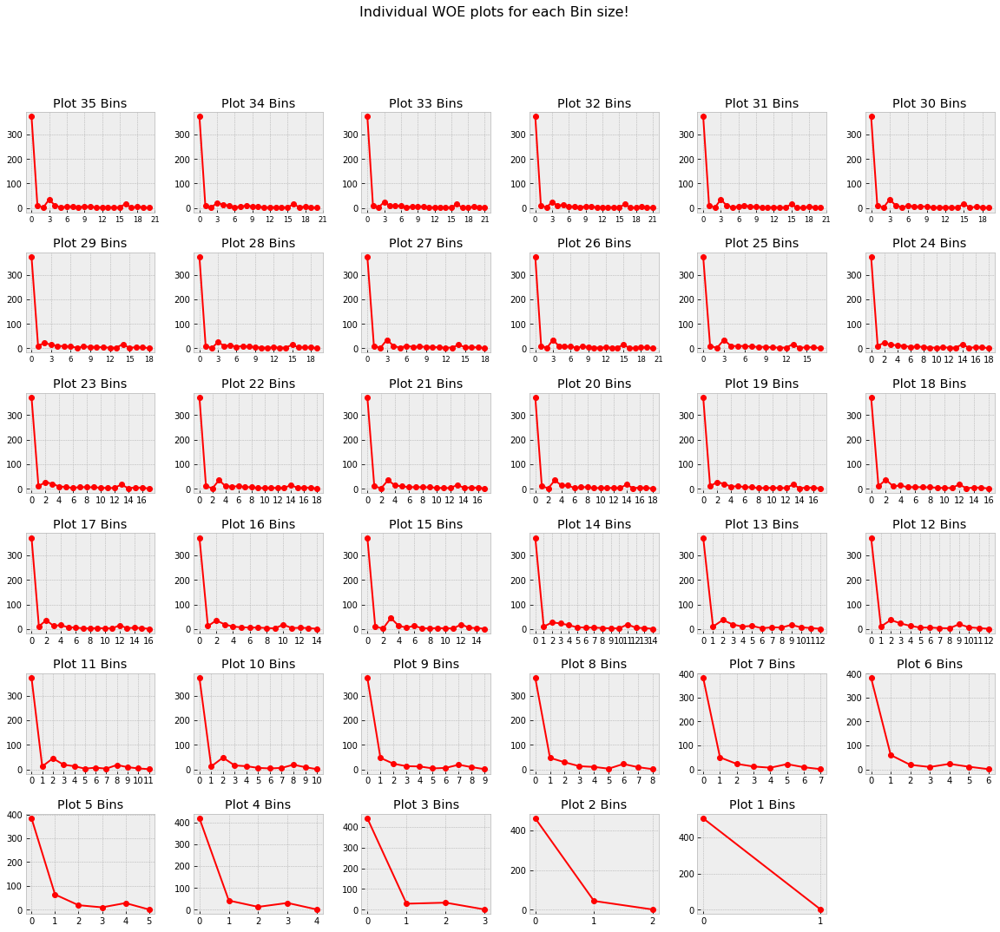

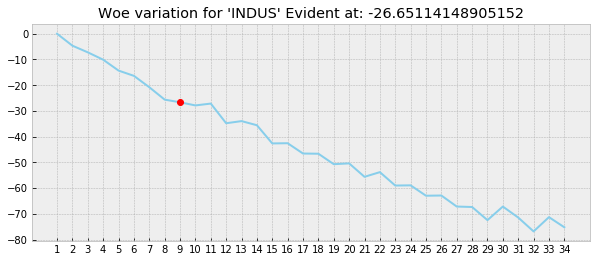

...

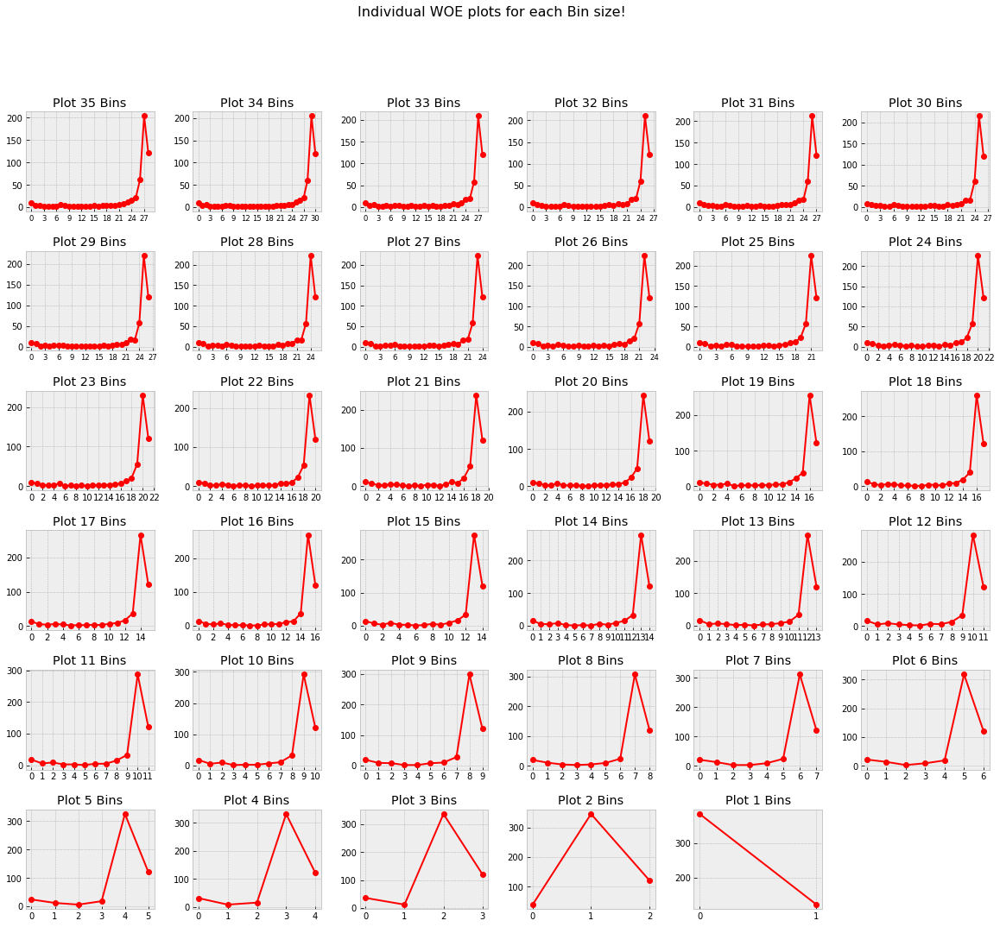

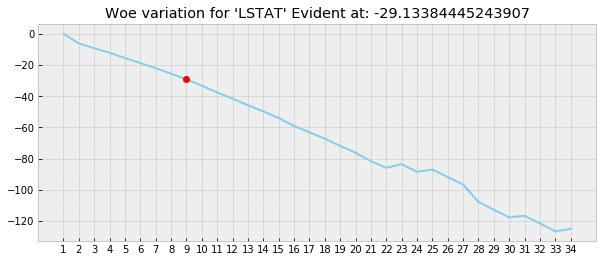

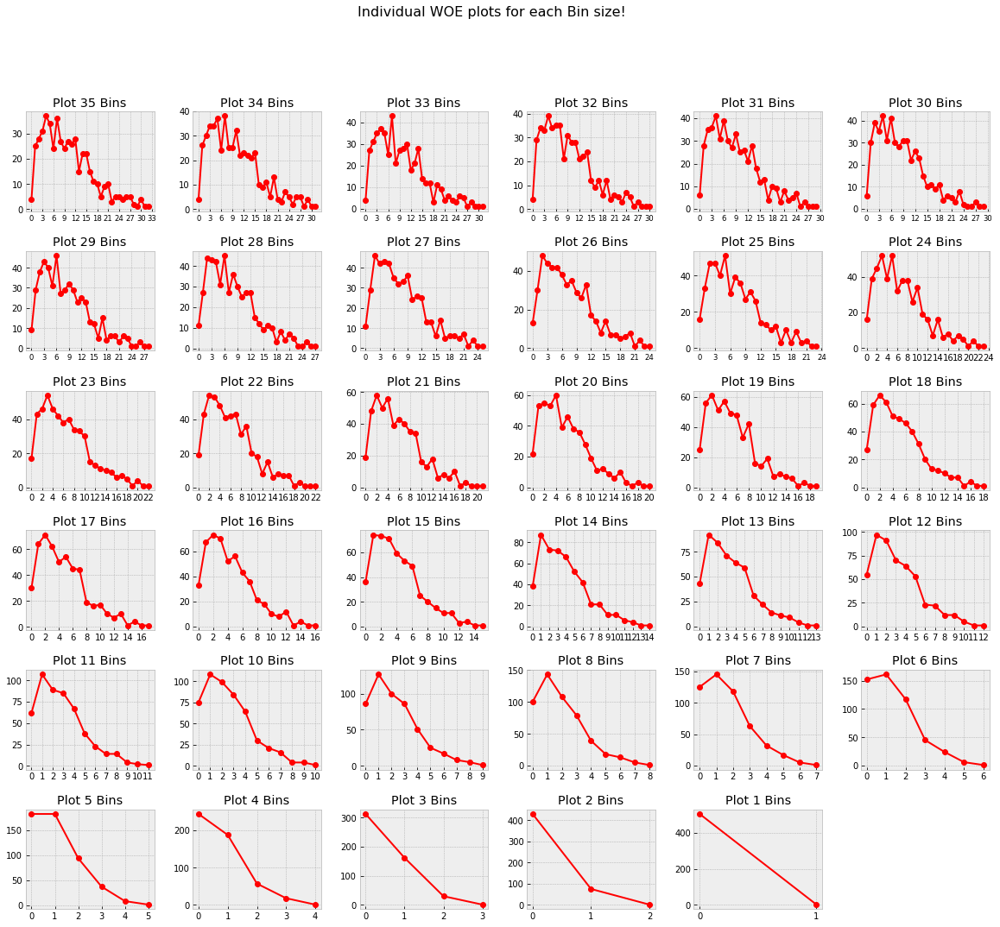

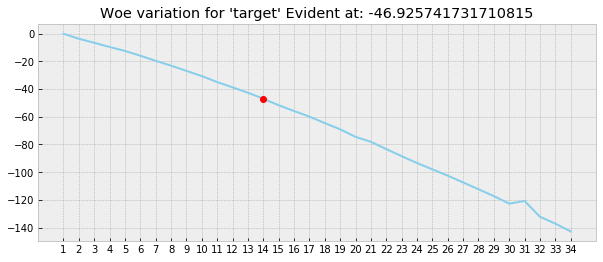

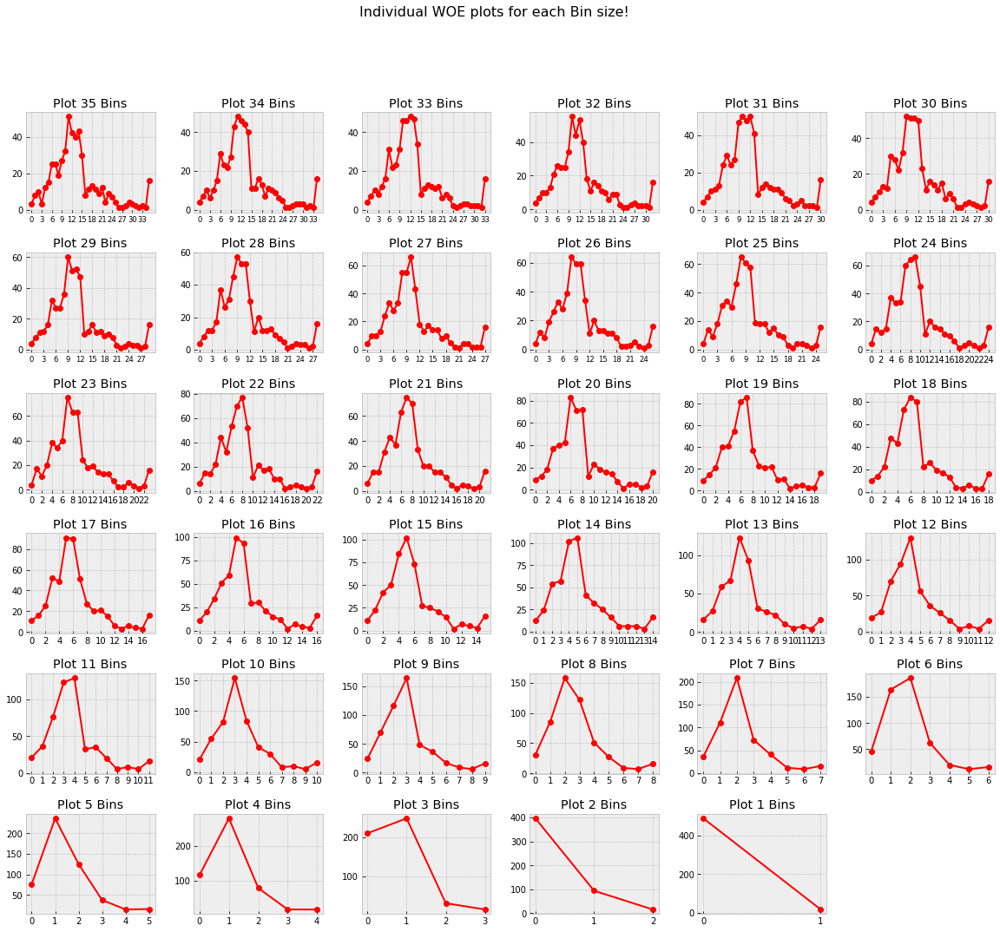

In [13]:

min_b = 1
max_b = 35
for i in range(df.shape[1]):
    woes = []
    ind = []
    for k in reversed(range(min_b,max_b)):
        woes.append(ef_num(df.iloc[:,i].values,bins=k,check_evidence=False))
        ind.append(k)
    ind = np.array(ind)
    woes = np.array(woes)
    evident = ef_num(df.iloc[:,i].values,bins=30)
    func = np.vectorize(lambda x: x == evident)
    plt.figure(figsize=(10,4))
    plt.plot(ind,woes,color='skyblue')
    plt.plot(ind[func(woes)], woes[func(woes)], 'ro')
    plt.xticks(ind)
    plt.title('Woe variation for \'{}\' Evident at: {}'.format(df.columns[i], evident))
    plt.show()
    plt_individual_woe(df.iloc[:,i].values,bin_range=(min_b, max_b))

In [14]:
col_woe = []
for i in range(df.shape[1]-1):
    print('For Column :{}'.format(df.columns[i]))
    woe_ = ef_num(df.iloc[:,i].values,bins=30)
    print('Evident Woe:{}'.format(woe_))
    col_woe.append((i,woe_))



For Column :CRIM
Evident Woe:0.0
For Column :ZN
Evident Woe:-25.441144344298337
For Column :INDUS
Evident Woe:-26.65114148905152
For Column :CHAS
Evident Woe:0.0
For Column :NOX
Evident Woe:-20.912954834720388
For Column :RM
Evident Woe:-16.718243618013197
For Column :AGE
Evident Woe:-75.24714999527856
For Column :DIS
Evident Woe:-9.876300530587748
For Column :RAD
Evident Woe:2.220446049250313e-16
For Column :TAX
Evident Woe:-6.941997690090183
For Column :PTRATIO
Evident Woe:-22.782151833866713
For Column :B
Evident Woe:-15.012436065880827
For Column :LSTAT
Evident Woe:-29.13384445243907


In [15]:
sorted(col_woe, key = lambda x: x[1], reverse=True)

[(8, 2.2204460492503131e-16),
 (0, 0.0),
 (3, 0.0),
 (9, -6.941997690090183),
 (7, -9.8763005305877485),
 (11, -15.012436065880827),
 (5, -16.718243618013197),
 (4, -20.912954834720388),
 (10, -22.782151833866713),
 (1, -25.441144344298337),
 (2, -26.651141489051518),
 (12, -29.133844452439071),
 (6, -75.247149995278562)]

In [9]:
def xtab(*cols, func=None, add_axis=None, apply_wt=False):
    '''
        param add_axis: 0 is row wise marginal , 1 is column wise marginal, (0,1) is both ways marginal
        returns:
        (i) xt, NumPy array storing the xtab results, number of dimensions is equal to 
            the len(args) passed in
        (ii) unique_vals_all_cols, a tuple of 1D NumPy array for each dimension 
            in xt (for a 2D xtab, the tuple comprises the row and column headers)
        pass in:
          (i) 1 or more 1D NumPy arrays of integers
          (ii) if wts is True, then the last array in cols is an array of weights

        if return_inverse=True, then np.unique also returns an integer index 
        (from 0, & of same len as array passed in) such that, uniq_vals[idx] gives the original array passed in
        higher dimensional cross tabulations are supported (eg, 2D & 3D)
        cross tabulation on two variables (columns):
        >>> q1 = NP.array([7, 8, 8, 8, 5, 6, 4, 6, 6, 8, 4, 6, 6, 6, 6, 8, 8, 5, 8, 6])
        >>> q2 = NP.array([6, 4, 6, 4, 8, 8, 4, 8, 7, 4, 4, 8, 8, 7, 5, 4, 8, 4, 4, 4])
        >>> uv, xt = xtab(q1, q2)
        >>> uv
        (array([4, 5, 6, 7, 8]), array([4, 5, 6, 7, 8]))
        >>> xt
        array([[2, 0, 0, 0, 0],
               [1, 0, 0, 0, 1],
               [1, 1, 0, 2, 4],
               [0, 0, 1, 0, 0],
               [5, 0, 1, 0, 1]], dtype=uint64)
    '''
    if not all(len(col) == len(cols[0]) for col in cols[1:]):
        raise ValueError("all arguments must be same size")

    if len(cols) == 0:
        raise TypeError("xtab() requires at least one argument")
    
    fnx1 = lambda q: len(q.squeeze().shape)
    if not all([fnx1(col) == 1 for col in cols]):
        raise ValueError("all input arrays must be 1D")

    if apply_wt:
        cols, wt = cols[:-1], cols[-1]
    else:
        wt = 1

    uniq_vals_all_cols, idx = zip( *(np.unique(col, return_inverse=True) for col in cols) )
    shape_xt = [uniq_vals_col.size for uniq_vals_col in uniq_vals_all_cols]
    dtype_xt = 'float' if apply_wt else 'uint'
    xt = np.zeros(shape_xt, dtype=dtype_xt)
    np.add.at(xt, idx, wt)
    
    if add_axis is not None:
        if add_axis == 0:
            xt = np.vstack((xt,np.einsum('ij->j',xt)))
        elif add_axis == 1:
            xt = np.hstack((xt,np.einsum('ij->i',xt).reshape(-1,1)))
        elif add_axis == (0,1):
            xt = np.vstack((xt,np.einsum('ij->j',xt)))
            xt = np.hstack((xt,np.einsum('ij->i',xt).reshape(-1,1)))
        else: 
            raise ValueError("add_axis should be 0 or 1 or (0,1)")
            
    return uniq_vals_all_cols, xt

In [10]:
def bin_skill(x, y, xt=None, modified=False, keep_orig=True, epsilon = 1e-16,verbose = 0):
    
    #if xtab is not available
    if xt is None:
        _,xt = xtab(x, y,add_axis=(0,1))
    
    if verbose > 1:
        print('Crosstab Matrix:\n{}'.format(xt))
    
    #getting basic values
    m,n = xt.shape
    m = m-1
    n = n-1
    pi = np.pi
    pi2 = pi/2
    pi4 = np.pi/4
    
    # setting iter variables
    corr_tetr = np.zeros((m,n))
    corr_pirc = np.zeros((m,n))
    corr_heid = np.zeros((m,n))
    corr_dool = np.zeros((m,n))
    corr_yule = np.zeros((m,n))
    if modified and keep_orig:
        corr_pirc_orig = np.zeros((m,n))
        corr_heid_orig = np.zeros((m,n))
        corr_dool_orig = np.zeros((m,n))

    counter = 0
    for i in range(m):
        for j in range(n):
            # getiing proportions
            val = xt[i,j]
            A = val / xt[m,n]
            B = (xt[i,n]-val) / xt[m,n]
            C = (xt[m,j]-val) / xt[m,n]
            D = (1-B-C+A)
            
            # getting probabilities
            p_c_f = xt[i,n] / xt[m,n]
            p_r_o = xt[m,j] / xt[m,n]
            
            mat = [[A,B],[C,D]]
            
            # using stat formula for tetrachoric correlation
            alpha = np.power((0 if A*D == 0 else A*D)/(1e-7 if B*C == 0 else B*C),pi4)
            corr_t = (alpha - 1)/(alpha + 1)

            # cosine formula fot tetrachoric corelation.. need to validate this
            # corr2 = np.cos(pi2/(np.sqrt(((A*D)/(1e-5 if B*C == 0 else B*C)))+1))

            # Pierce Measure
            corr_p = (A - (p_r_o*p_c_f)) / (p_r_o*(1-p_r_o))
        
            # Heidke Measure
            corr_h = 2*(A - (p_r_o*p_c_f)) / (p_r_o + p_c_f - 2*p_r_o*p_c_f)

            # Square root of Doolittle Measure
            corr_d = (A - (p_r_o*p_c_f)) / np.sqrt(p_r_o*(1-p_r_o)*p_c_f*(1-p_c_f))

            # Yule's skill score
            corr_y = (A - (p_r_o*p_c_f)) / (A*(1- 2*(p_r_o + p_c_f) + 2*A) + p_r_o*p_c_f)
            
            if modified and keep_orig:
                corr_p_m = np.sin(pi2*corr_p) if np.sin(pi2*corr_p) >= epsilon else epsilon
                corr_h_m = np.sin(pi2*corr_h) if np.sin(pi2*corr_h) >= epsilon else epsilon
                corr_d_m = np.sin(pi2*corr_d) if np.sin(pi2*corr_d) >= epsilon else epsilon
                corr_pirc[i,j] = corr_p_m
                corr_heid[i,j] = corr_h_m
                corr_dool[i,j] = corr_d_m
                corr_pirc_orig[i,j] = corr_p
                corr_heid_orig[i,j] = corr_h
                corr_dool_orig[i,j] = corr_d
            elif modified:
                corr_p_m = np.sin(pi2*corr_p) if np.sin(pi2*corr_p) >= epsilon else epsilon
                corr_h_m = np.sin(pi2*corr_h) if np.sin(pi2*corr_h) >= epsilon else epsilon
                corr_d_m = np.sin(pi2*corr_d) if np.sin(pi2*corr_d) >= epsilon else epsilon
                corr_pirc[i,j] = corr_p_m
                corr_heid[i,j] = corr_h_m
                corr_dool[i,j] = corr_d_m
            else:
                corr_pirc[i,j] = corr_p 
                corr_heid[i,j] = corr_h 
                corr_dool[i,j] = corr_d 

            # fitting values in correlation matrix                
            corr_tetr[i,j] = corr_t
            corr_yule[i,j] = corr_y
            
            if verbose > 3:
                print('Iteration for i:{} j:{} val:{} sum:{} alpha:{} corr_t:{} corr_cos:{} corr_p:{} corr_h:{} corr_d:{} corr_y:{} '.format(
                    i, j, val, np.sum(mat), alpha, corr_t, corr2, corr_p, corr_h, corr_d, corr_y ))
                print('Proportion Matrix:\n{}'.format(np.array(mat)))
            
            if m == n == 2:
                break
            counter += 1
        if m == n == 2:
            break
            
    if m == n == 2:
        counter = 1
            
    if keep_orig:
        if verbose > 2:
            print('Correlation Matrices: \n corr_tetr:\n {} \n corr_yule:\n {} \n corr_pirc:\n {} \n corr_heid:\n {} \n corr_dool:\n {} \n corr_pirc_orig:\n'
            ' {} \n corr_heid_orig:\n {} \n corr_dool_orig:\n {}'.format(
                corr_tetr, corr_yule, corr_pirc, corr_heid, corr_dool, corr_pirc_orig, corr_heid_orig, corr_dool_orig))
        if verbose > 0:
            print('\nNet Correlation: \ncorr_tetr:{} corr_yule:{}, corr_pirc:{} corr_heid:{} corr_dool:{} corr_pirc_orig:{} corr_heid_orig:{} corr_dool_orig:{} '.format(
                np.sum(np.abs(corr_tetr))/counter, np.sum(corr_yule)/counter, np.sum(corr_pirc)/counter, np.sum(corr_heid)/counter, np.sum(corr_dool)/counter,
                np.sum(corr_pirc_orig)/counter,np.sum(corr_heid_orig)/counter,np.sum(corr_dool_orig)/counter,))
        if modified:
            return corr_tetr, corr_yule, corr_pirc, corr_heid, corr_dool, corr_pirc_orig, corr_heid_orig, corr_dool_orig
        else:
            pass
    else:
        if verbose > 1:
            print('Correlation Matrices: \n corr_tetr:\n {} \n corr_pirc:\n {} \n corr_heid:\n {} \n corr_dool:\n {} \n corr_yule:\n {} '.format(
                corr_tetr, corr_pirc, corr_heid, corr_dool, corr_yule))
        if verbose > 0:
            print('\nNet Correlation: \ncorr_tetr:{} corr_pirc:{} corr_heid:{} corr_dool:{} corr_yule:{}'.format(
                np.sum(corr_tetr)/counter,np.sum(corr_pirc)/counter,np.sum(corr_heid)/counter,np.sum(corr_dool)/counter,np.sum(corr_yule)/counter))
        return corr_tetr, corr_yule, corr_pirc, corr_heid, corr_dool 

In [11]:
def generate_ef_skill(df, bins = 'fd', check_evidence=True, evidence_criteria='base',verbose = 0):
    
    m,n = df.shape
    
    print('Skills to generate :{}'.format(n))
    
    if isinstance(df, pd.DataFrame):
        cols = df.columns
        df_flag = True
    elif isinstance(df, np.ndarray):
        cols = None
        df_flag = False
    
    skills = []
    for i in range(n):
        if verbose > 0:
            print('Calculating EF for : {}'.format(cols[i] if cols is not None else i))
        
        # Calculating evidence factor
        if df_flag:
            arr = df.iloc[:,i].values
        else:
            arr = df[:,i]
        
        if arr.dtype in [np.number]:
            efs_i = ef_num(arr, bins=bins, check_evidence=check_evidence, evidence_criteria=evidence_criteria, return_array=True, verbose=verbose)
        else:
            efs_i = ef_cat(arr, return_array=True, verbose=verbose)

        if len(efs_i[2]) == 1:
            warnings.warn('Single bin condition observed!')
            efs_i = ef_cat(arr, return_array=True, verbose=verbose)
        skills.append(efs_i)
    return skills
        

def evaluate_pair(ef_skill, pair, skill='tetra', aggregate_skill ='sum', modified_skill=False, verbose=0):
    
    if len(pair) != 2:
        raise ValueError('Pair can take only two values!')
    
    a_1, a_2 = pair
    
    # getting skill from precalculated values
    efs1 = ef_skill[a_1]
    efs2 = ef_skill[a_2]
    
    # calculating skill score / correlation
    efs_skill  = bin_skill(efs1[1], efs2[1], modified=modified_skill, keep_orig=False, verbose=verbose)
    
    skill_mat = None
    if skill == 'tetra':
        skill_mat = efs_skill[0]
    elif skill == 'yule':
        skill_mat = efs_skill[1]
    elif skill == 'pierce':
        skill_mat = efs_skill[2]
    elif skill == 'heidke':
        skill_mat = efs_skill[3]
    elif skill == 'doolittle':
        skill_mat = efs_skill[4]
    else:
        skill_mat = efs_skill[0]

    if verbose > 0:
        print('Net \'{}\' Skill Score: {}'.format(skill,np.mean(skill_mat)))

    if verbose > 1:
        print('Skill Matrix:\n{}'.format(skill_mat))
    
    if aggregate_skill == 'sum':
        skill_1 = np.sum(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.sum(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'avg':
        skill_1 = np.mean(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.mean(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'max':
        skill_1 = np.max(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.max(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'min':
        skill_1 = np.min(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.min(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'med':
        skill_1 = np.median(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.median(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'std':
        skill_1 = np.std(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.std(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    elif aggregate_skill == 'range':
        skill_1 = np.max(skill_mat*efs1[0].reshape(-1,1),axis=1) - np.min(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.max(skill_mat.T*efs2[0].reshape(-1,1),axis=1) - np.min(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    # elif aggregate_skill == 'iqr':
    #     skill_1 = np.std(skill_mat*efs1[0].reshape(-1,1),axis=1)
    #     skill_2 = np.std(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    else:
        skill_1 = np.sum(skill_mat*efs1[0].reshape(-1,1),axis=1)
        skill_2 = np.sum(skill_mat.T*efs2[0].reshape(-1,1),axis=1)
    
    # storing scores
    score_1 = (efs1[0],skill_1,efs1[2],efs1[3])
    score_2 = (efs2[0],skill_2,efs2[2],efs2[3])
    
    return score_1, score_2

In [12]:
def plot_skill_behaviour(df, bins='fd', skill='tetra', aggregate_skill='sum',verbose=0):

    # doing whole step on data set in one go
    counters = 0
    cols = [i for i in range(0,df.shape[1])]
    skill_eval = [[] for _ in cols]
    if verbose >0:
        print('Number of columns to test: {} '.format(len(skill_eval)))    
    
    ef_skill = generate_ef_skill(df, bins=bins, verbose=verbose)
    for i in itertools.combinations(cols, 2):
        eval_p = evaluate_pair(ef_skill=ef_skill, pair=i, skill=skill, verbose=verbose)
        for k,val in enumerate(i):
            skill_eval[val].append(eval_p[k])
            if verbose > 2:
                print('Added evaluation for {}'.format(val))

        counters+=1
    if verbose >0:
        print('Number of evaluations :{}'.format(counters))

    for k,col_skill in enumerate(skill_eval):    
        col_skill_score = []
        col_ef_score = []
        for i in col_skill:
            col_skill_score.append(i[1])
            col_ef_score.append(i[0])
        col_skill_score = np.sum(col_skill_score,axis=0)
        col_ef_score = np.sum(col_ef_score,axis = 0)

        # Data
        skill_df=pd.DataFrame({'value_range': range(0,col_skill_score.shape[0]), 
                               'net_skill_score': col_skill_score, 
                               'net_ef_score': col_ef_score,
                               'bin_freq': i[3] })

        # multiple line plot
        plt.figure(figsize=(20,7))
        plt.subplot(1,2,1)
        plt.plot( 'value_range', 'net_skill_score', data=skill_df, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
        plt.plot( 'value_range', 'bin_freq', data=skill_df, marker='', color='black', linewidth=3)
        plt.plot( 'value_range', 'net_ef_score', data=skill_df, marker='', color='olive', linewidth=2, linestyle='dashed')
        plt.title('Sorted by Values of Variable')
        plt.legend()

        plt.subplot(1,2,2)
        skill_df.sort_values('net_skill_score',inplace=True)
        skill_df.reset_index()
        col_ef_score = col_ef_score[np.argsort(col_skill_score)]
        hist = i[3][np.argsort(col_skill_score)]
        values = i[2][np.argsort(col_skill_score)]
        col_skill_score = col_skill_score[np.argsort(col_skill_score)]

    #     plt.plot(i[2])
        plt.plot( col_skill_score, marker='o', markerfacecolor='blue', markersize=9, color='skyblue', linewidth=4,label = 'net_skill_score')
        plt.plot( hist, marker='', color='black', linewidth=3,label = 'bin_freq')
        plt.plot( col_ef_score, marker='', color='olive', linewidth=2, linestyle='dashed',label = 'net_ef_score')
        plt.plot( values, marker='', color='red', linewidth=3, linestyle='dashed', label = 'data_values')
        plt.title('Sorted order of Skill Score')
        plt.legend()
    #     plt.xticks(values)
    #     plt.xlabel(values)
        plt.suptitle('Plot for {}'.format(df.columns[k]),fontsize=16)
        plt.show()

Number of columns to test: 14 
Skills to generate :14
Calculating EF for : CRIM
Evident number of Bins: 38
Calculating EF for : ZN
Evident number of Bins: 22
Calculating EF for : INDUS
Evident number of Bins: 9
Calculating EF for : CHAS
Evident number of Bins: 1
Calculating EF for : NOX
Evident number of Bins: 11
Calculating EF for : RM
Evident number of Bins: 27
Calculating EF for : AGE
Evident number of Bins: 8
Calculating EF for : DIS
Evident number of Bins: 15
Calculating EF for : RAD
Evident number of Bins: 3
Calculating EF for : TAX
Evident number of Bins: 5
Calculating EF for : PTRATIO
Evident number of Bins: 14
Calculating EF for : B
Evident number of Bins: 49
Calculating EF for : LSTAT
Evident number of Bins: 15
Calculating EF for : target
Evident number of Bins: 23

Net Correlation: 
corr_tetr:-0.8596090180999563 corr_pirc:-3.984053916118983e-19 corr_heid:-0.006848941161418213 corr_dool:-0.004651829174163373 corr_yule:-0.861244019138756
Net 'yule' Skill Score: -0.861244019138

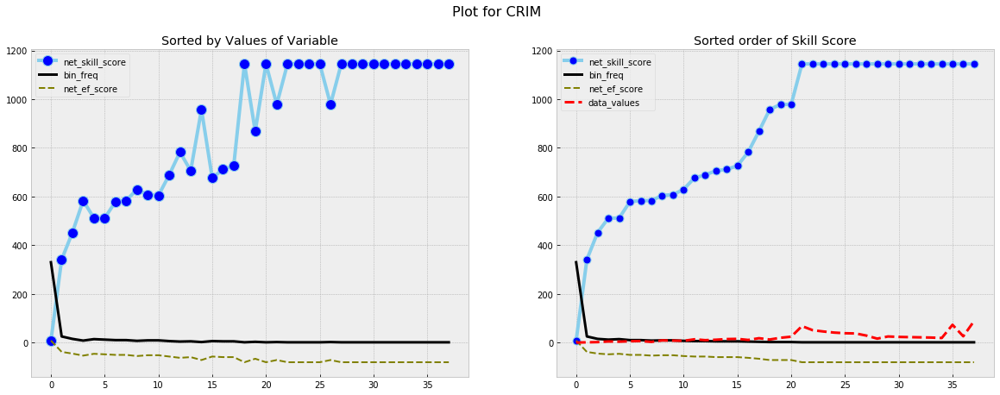

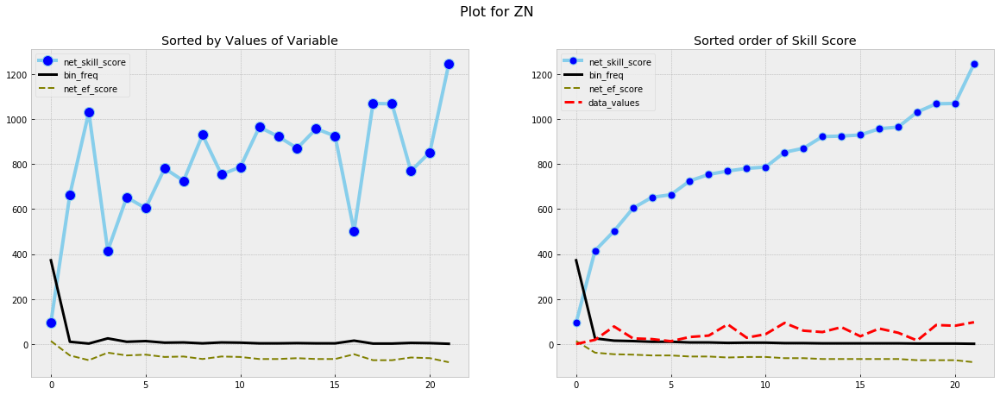

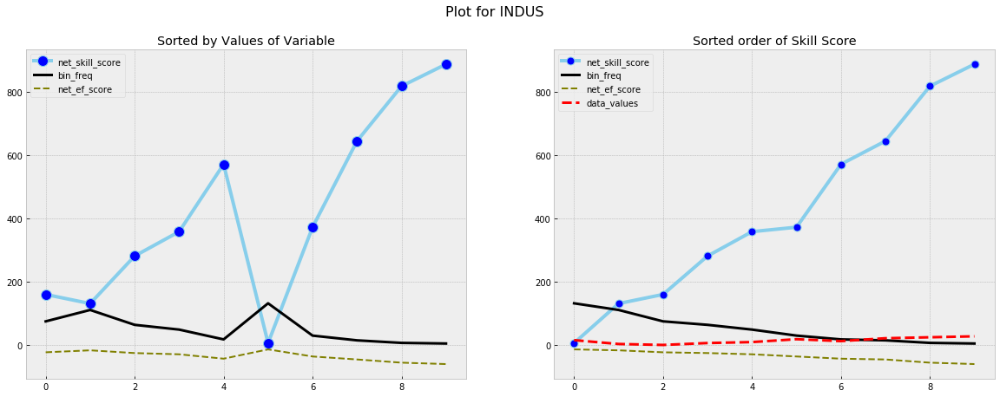

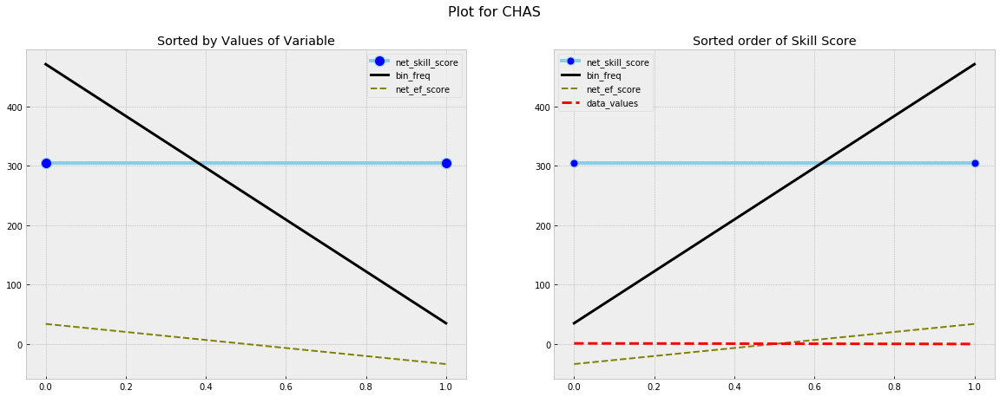

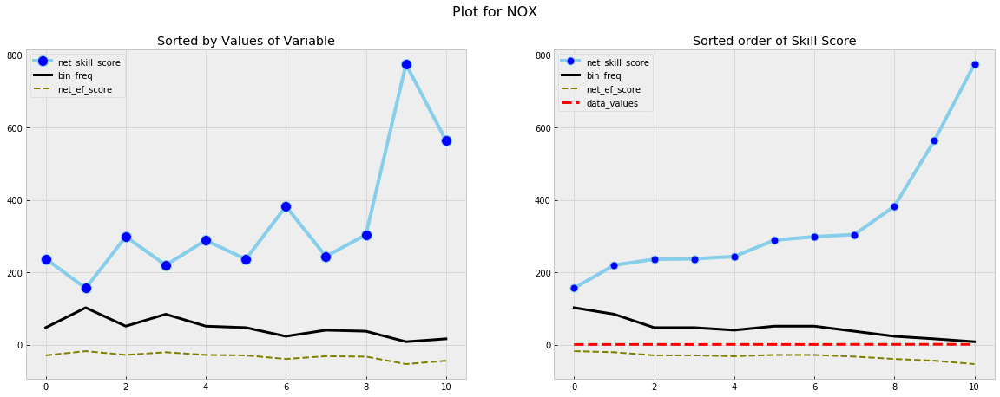

...

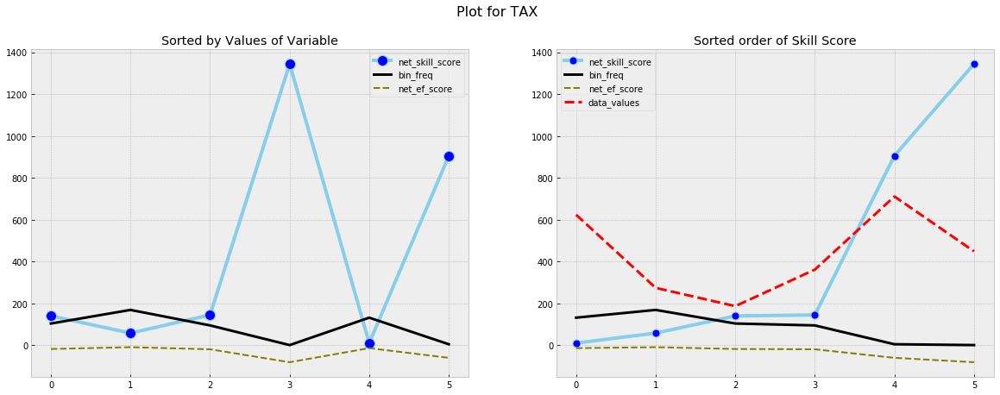

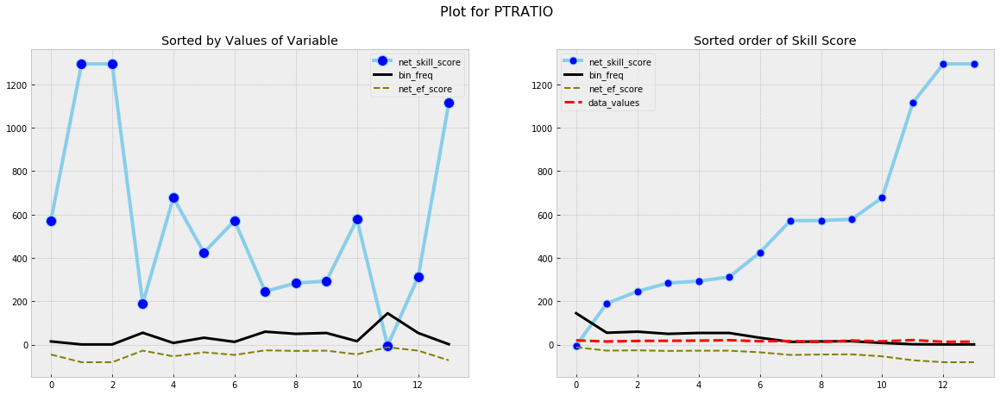

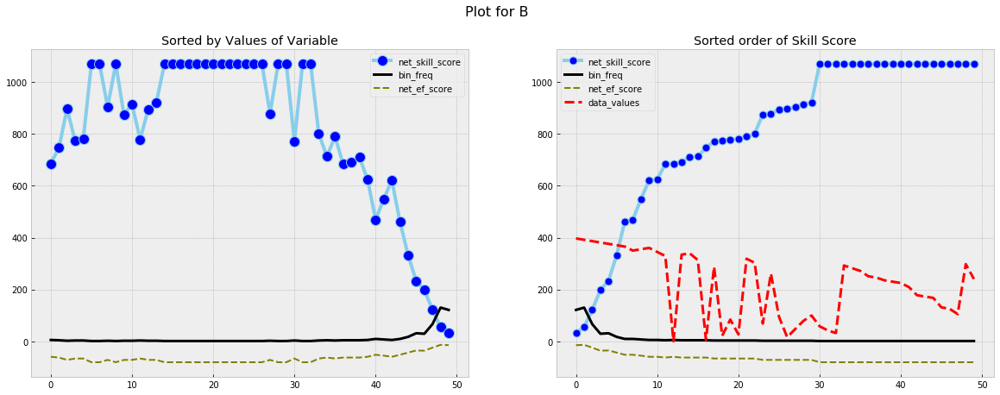

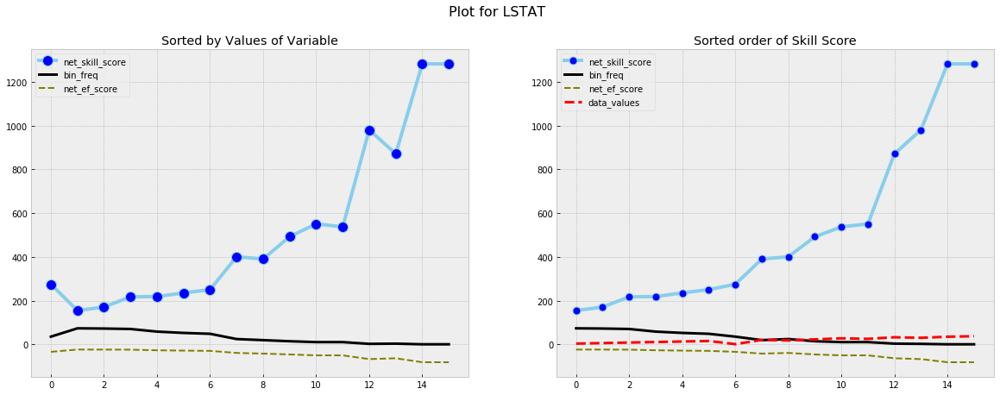

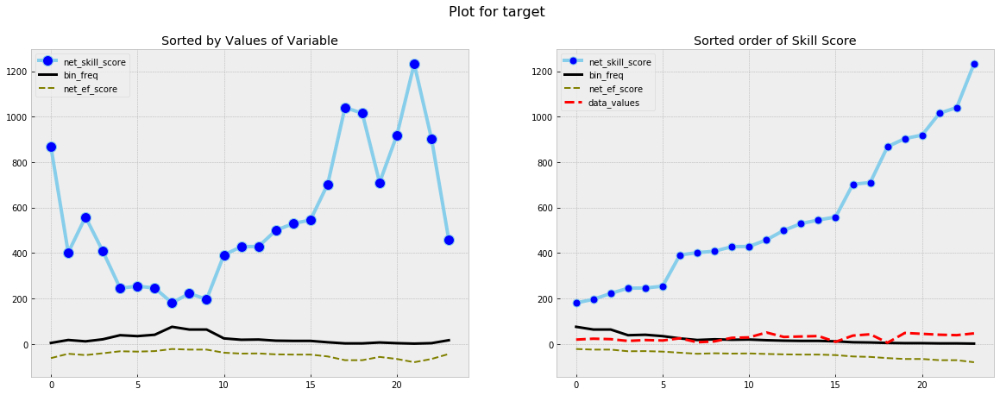

In [15]:
plot_skill_behaviour(df,bins='fd',skill='yule',aggregate_skill='avg',verbose=1)

Skills to generate :14


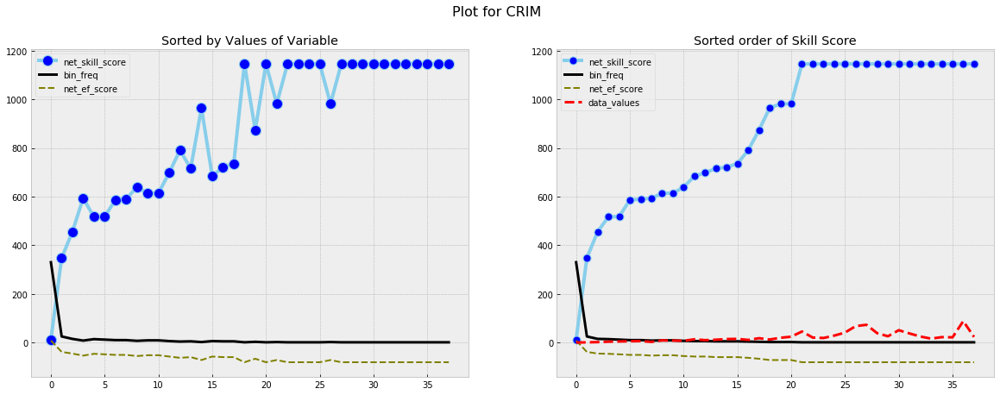

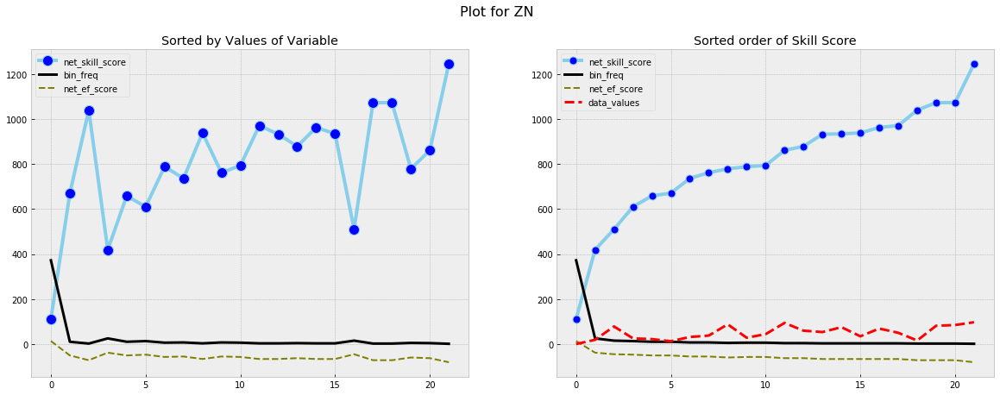

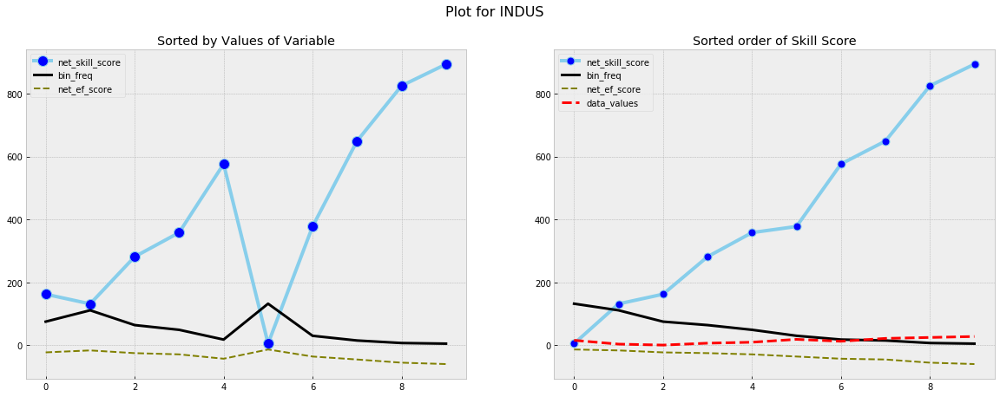

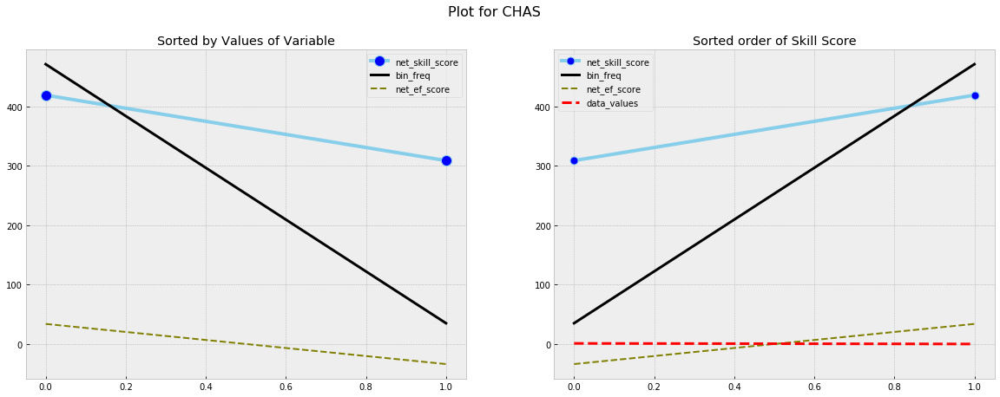

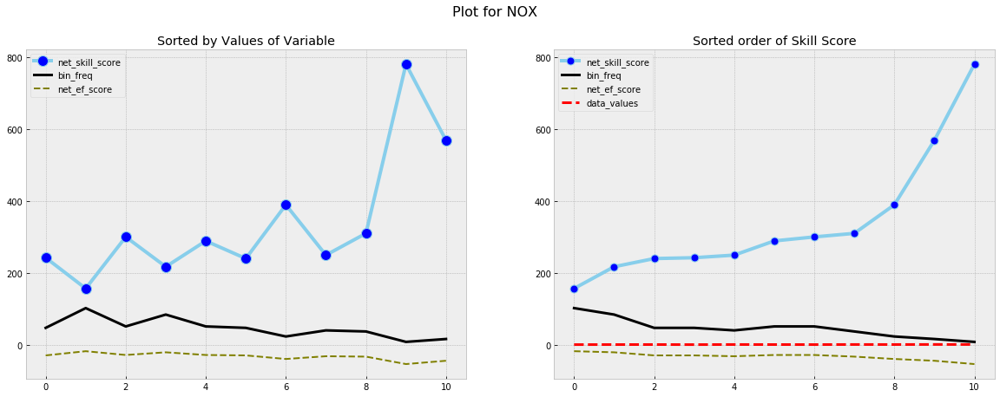

...

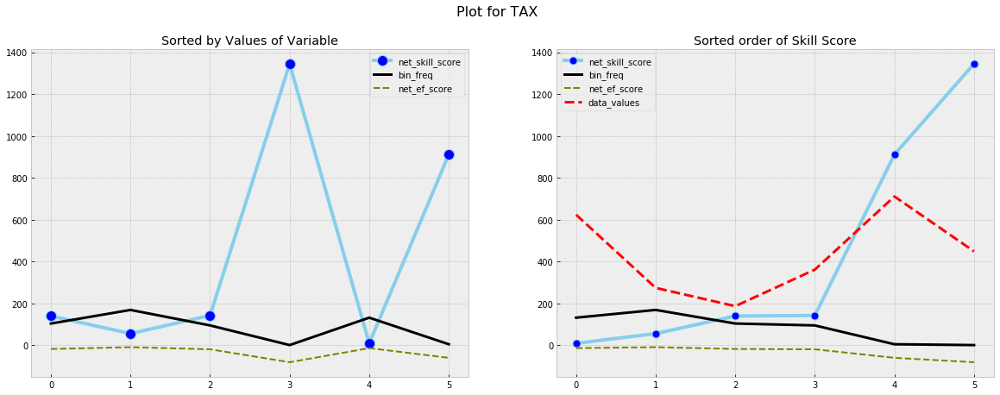

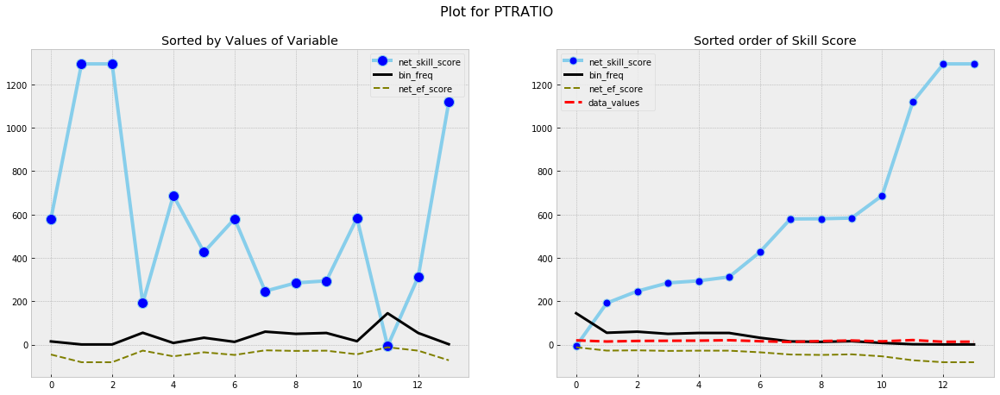

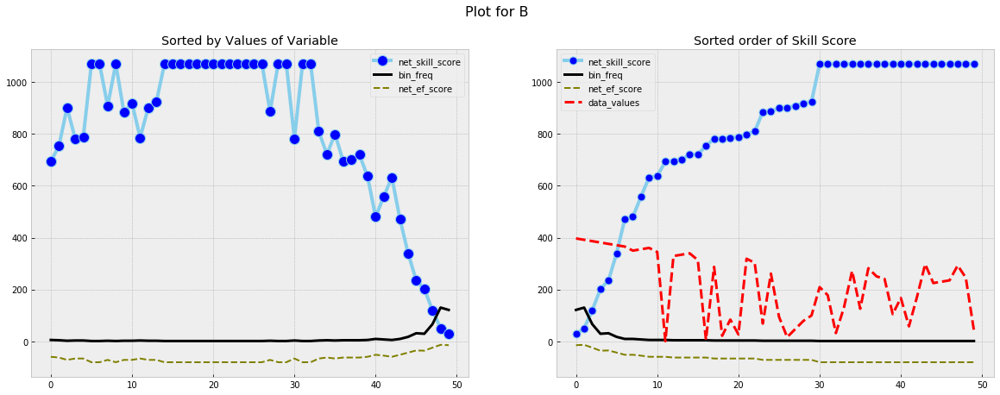

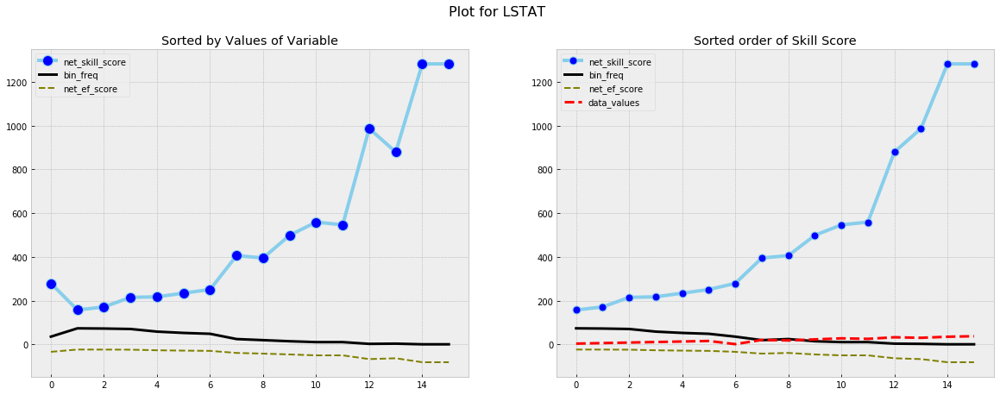

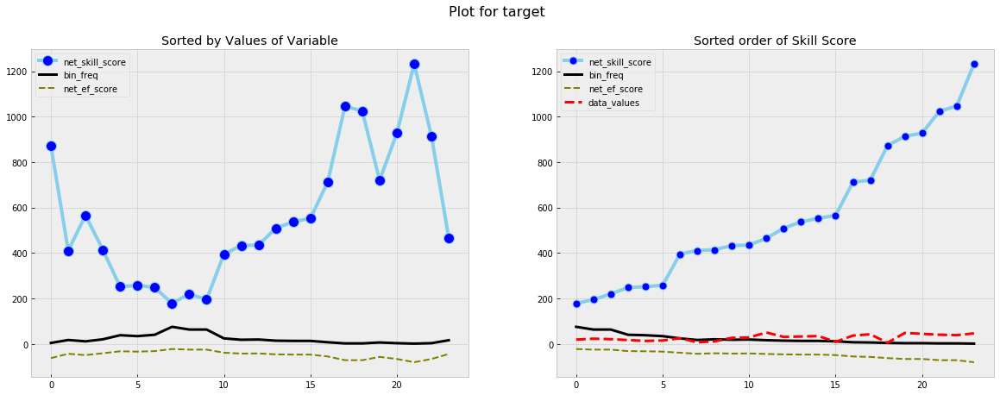

In [21]:
plot_skill_behaviour(df,bins='fd',skill='tetra',aggregate_skill='max',verbose=0)

Skills to generate :14


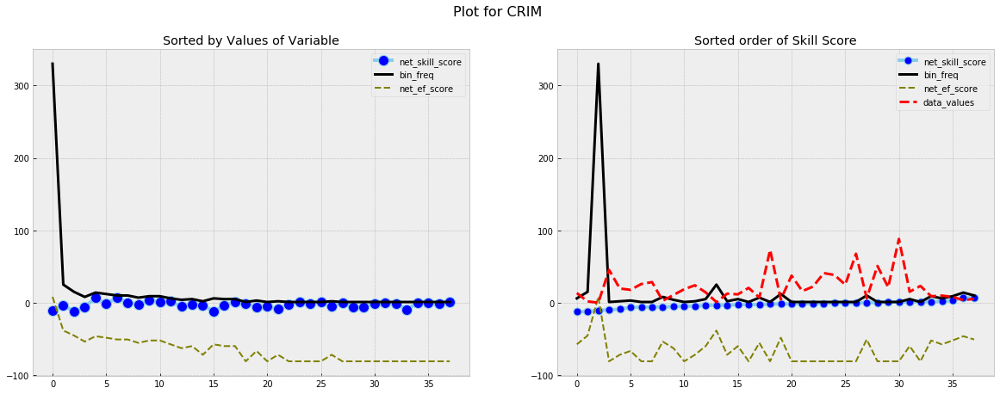

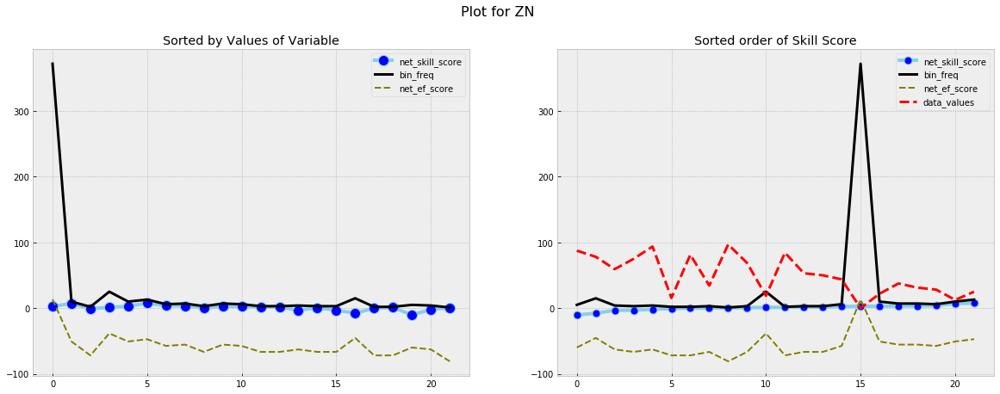

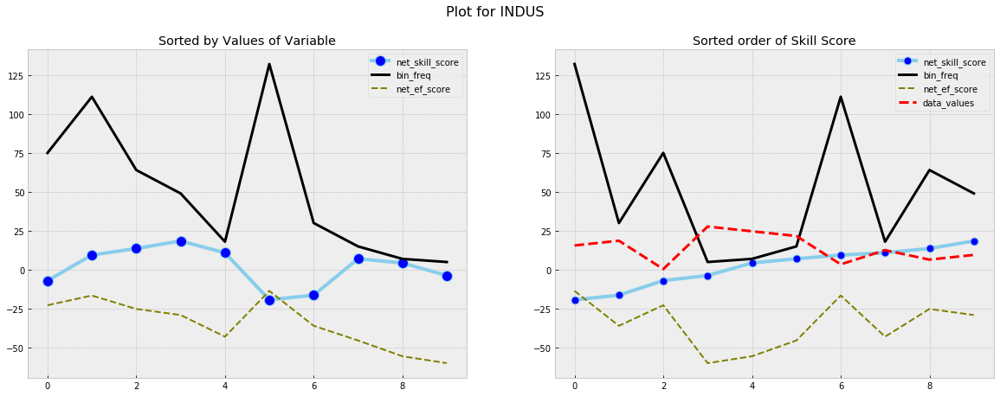

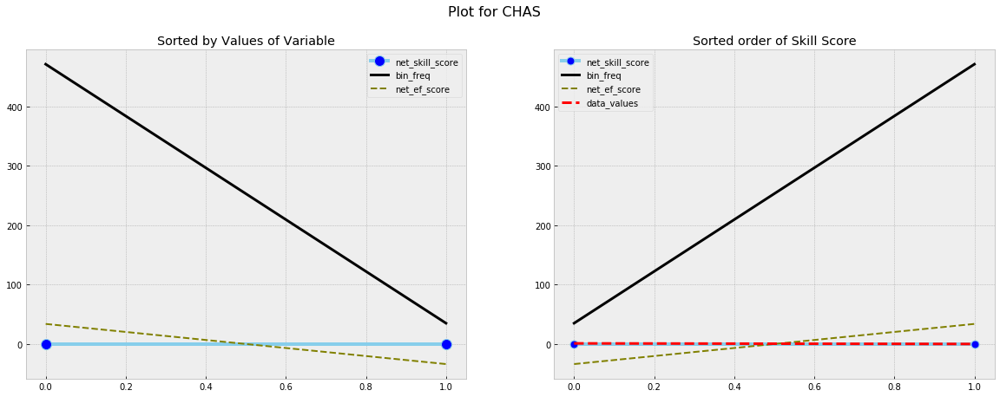

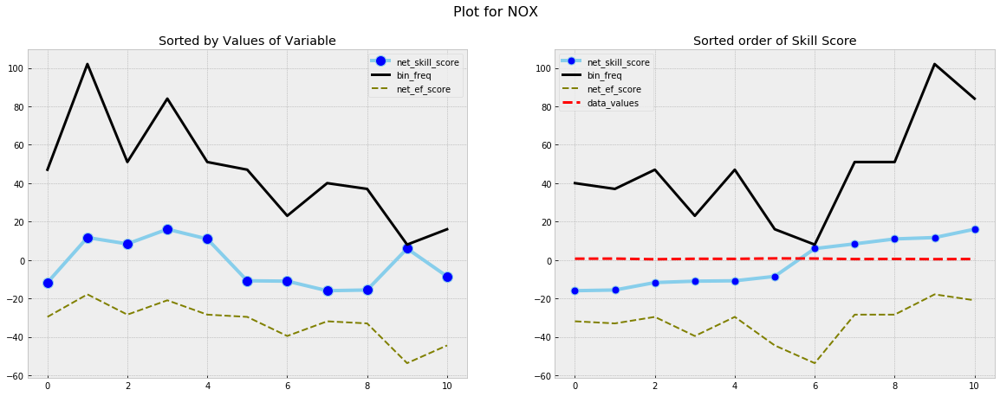

...

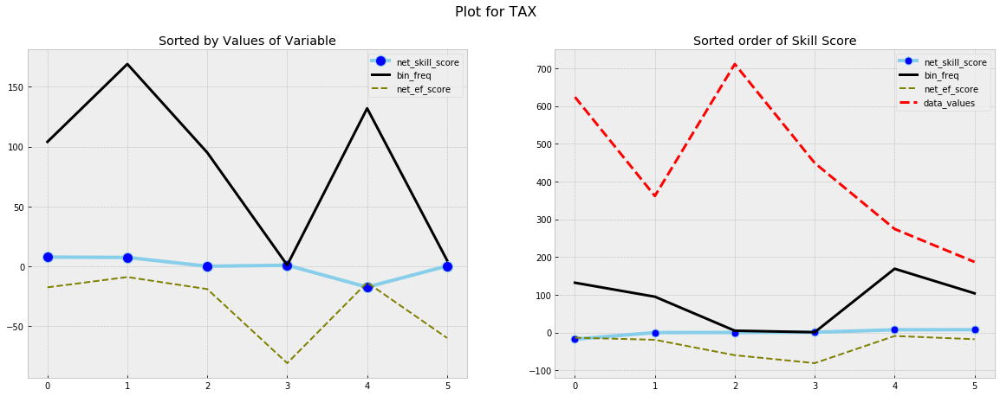

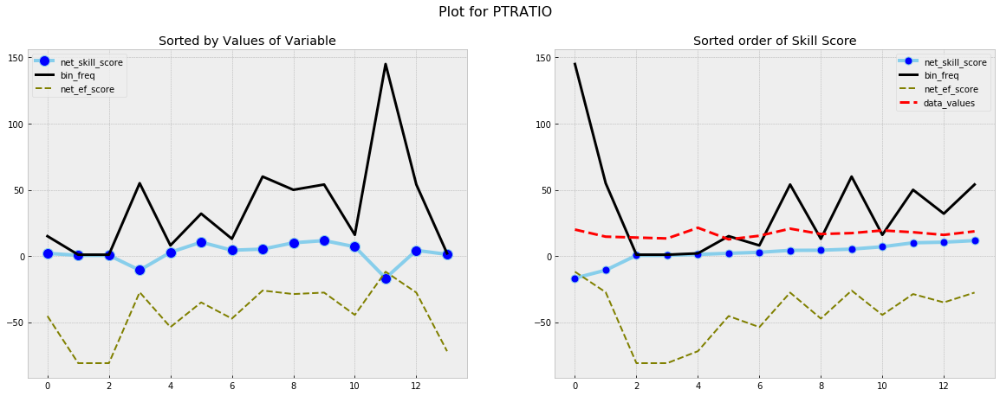

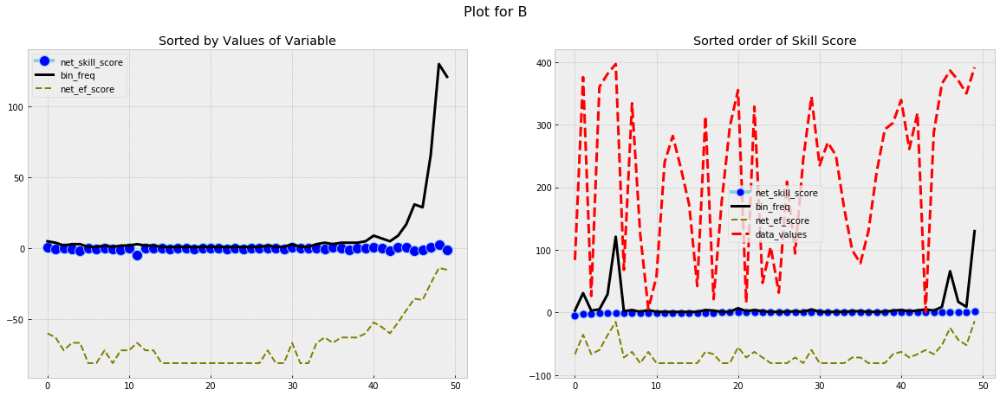

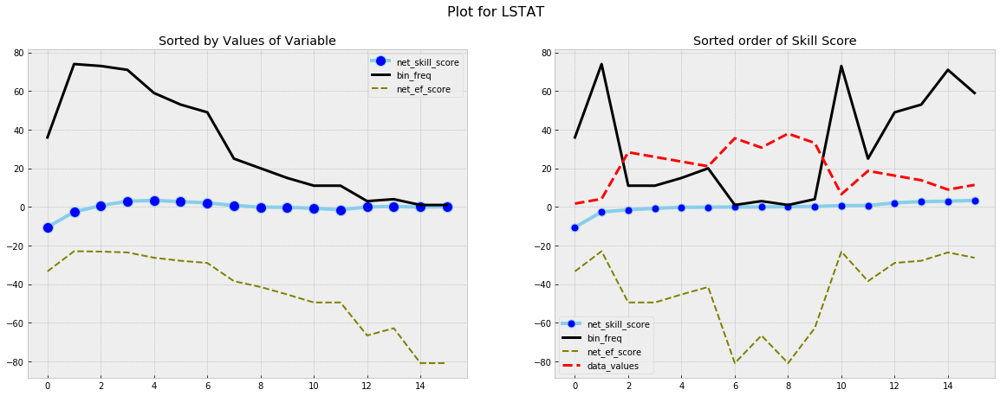

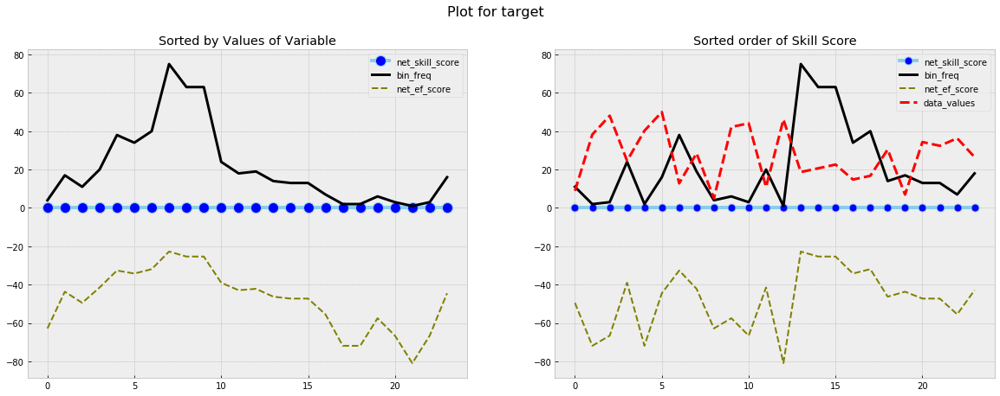

In [22]:
plot_skill_behaviour(df,bins='fd',skill='pierce',aggregate_skill='mean',verbose=0)

Skills to generate :14


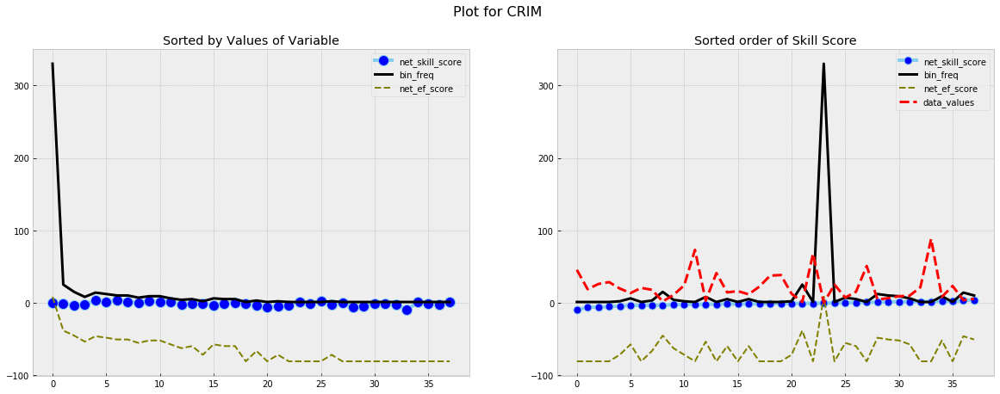

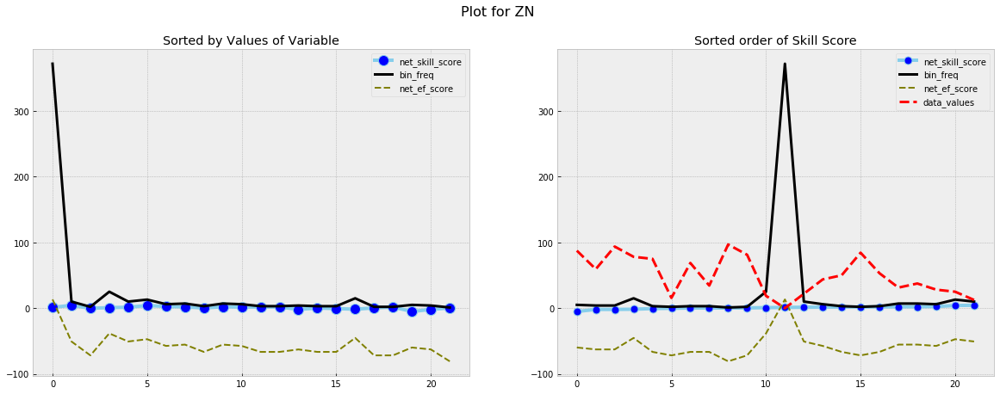

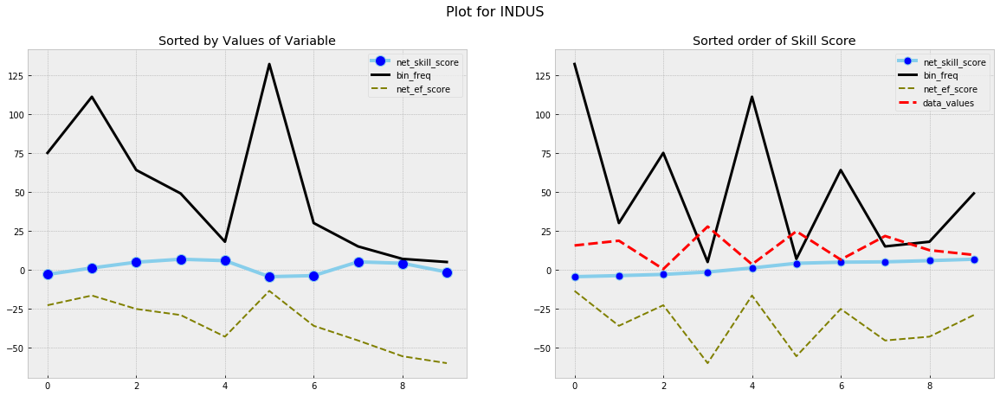

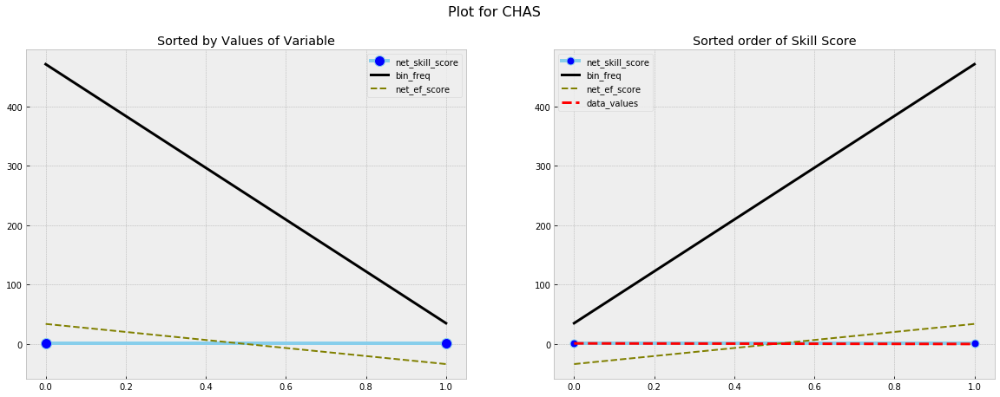

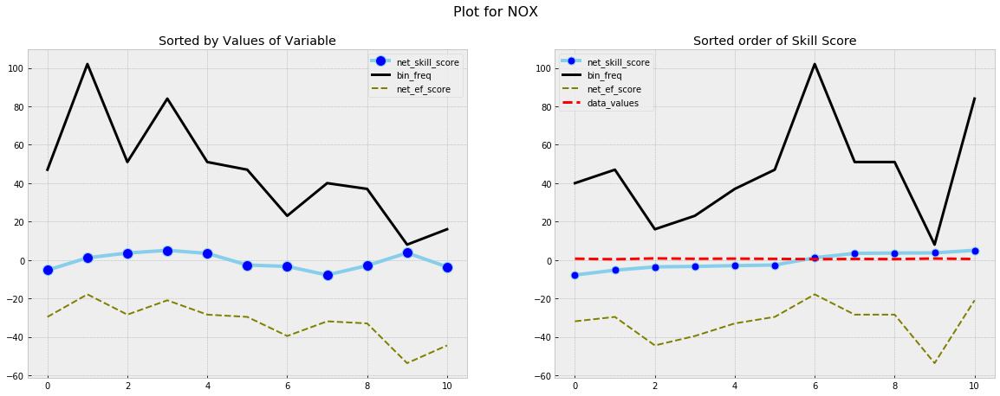

...

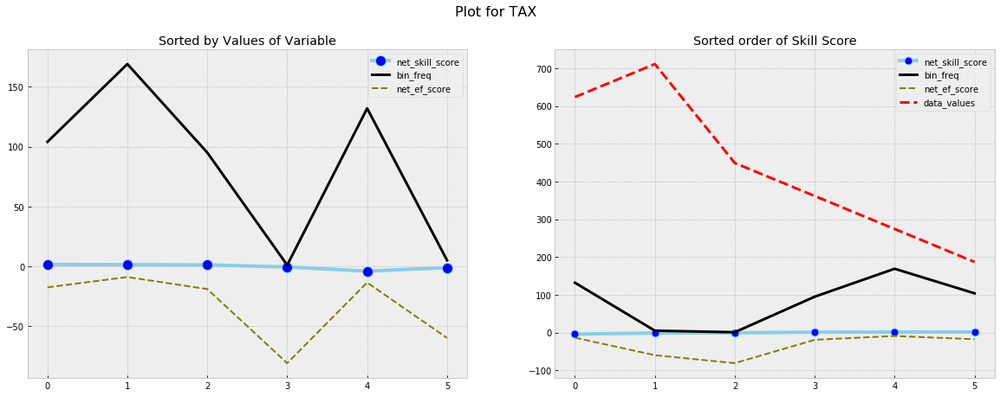

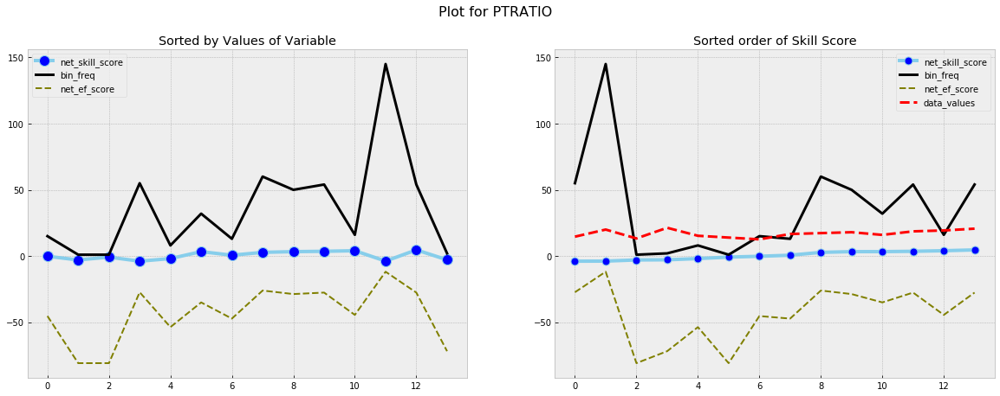

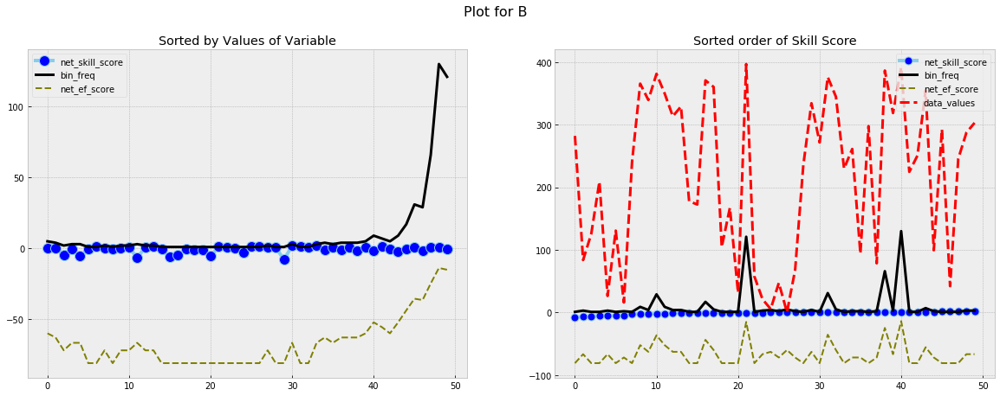

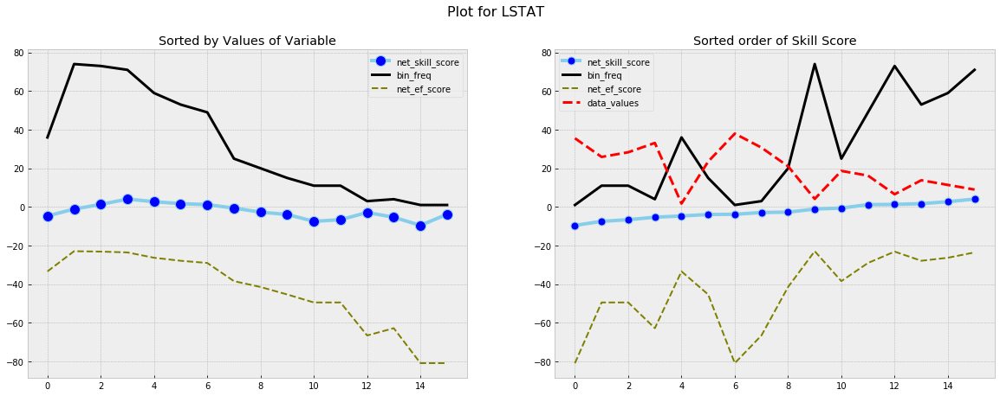

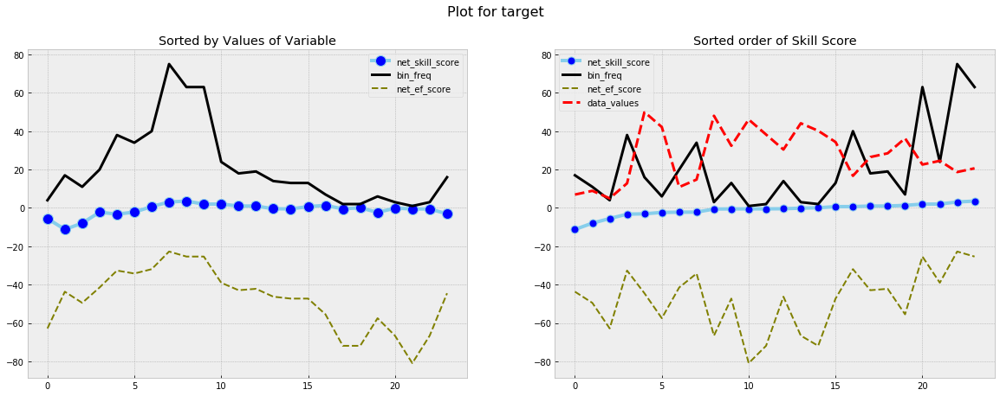

In [23]:
plot_skill_behaviour(df,bins='fd',skill='doolittle',verbose=0)

Skills to generate :14


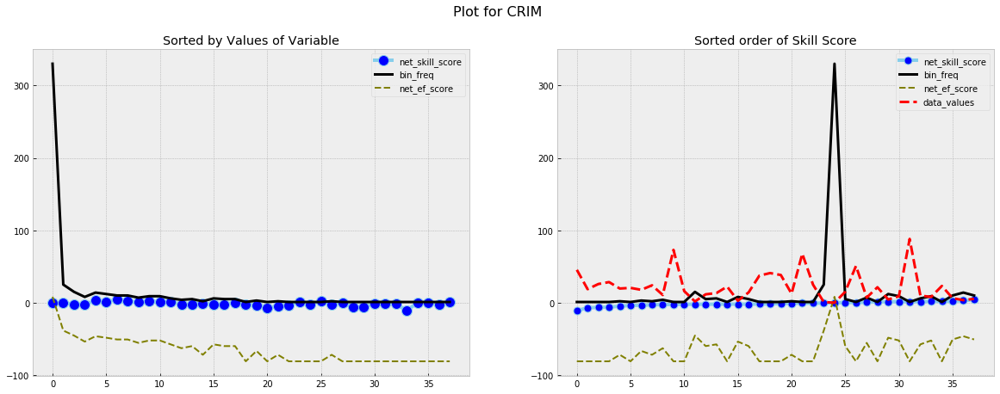

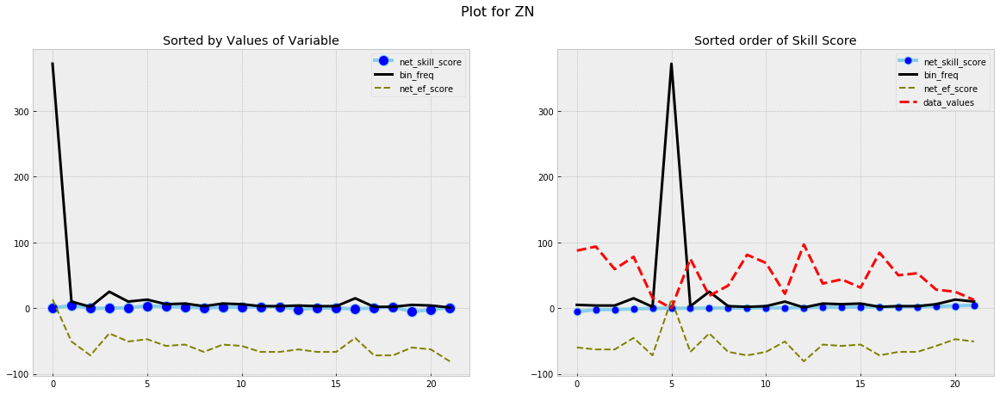

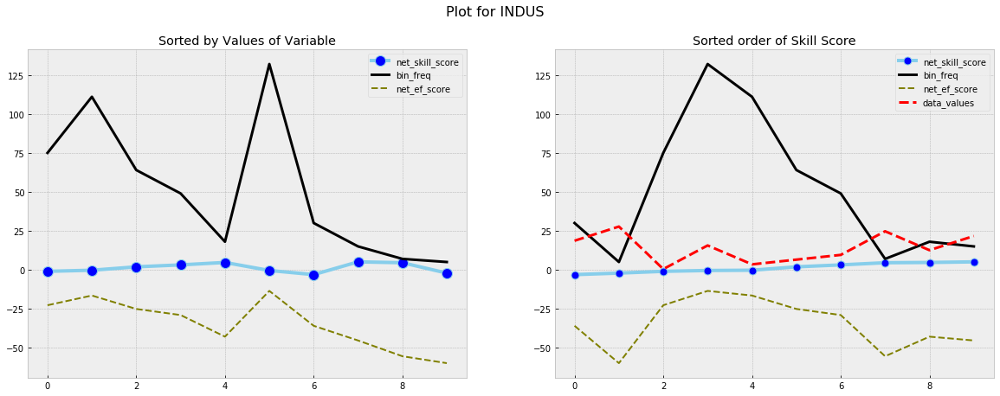

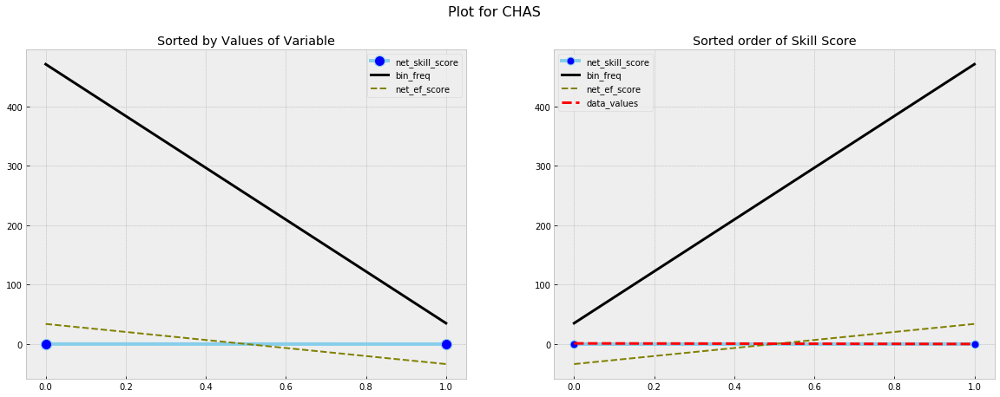

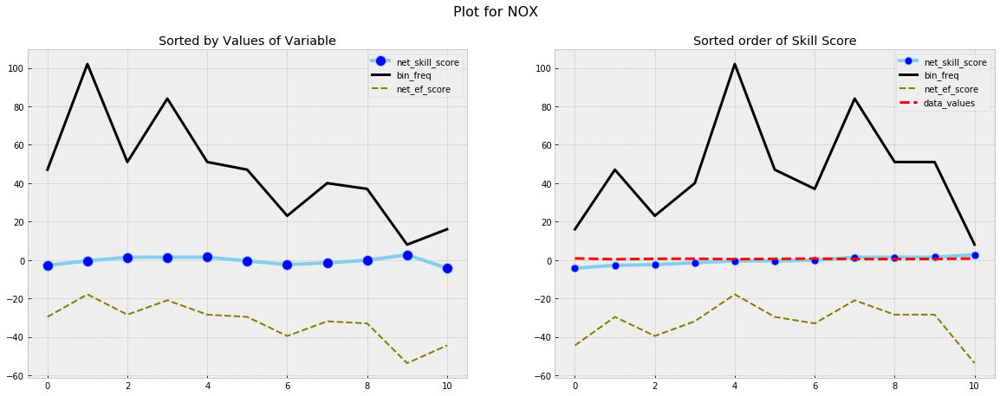

...

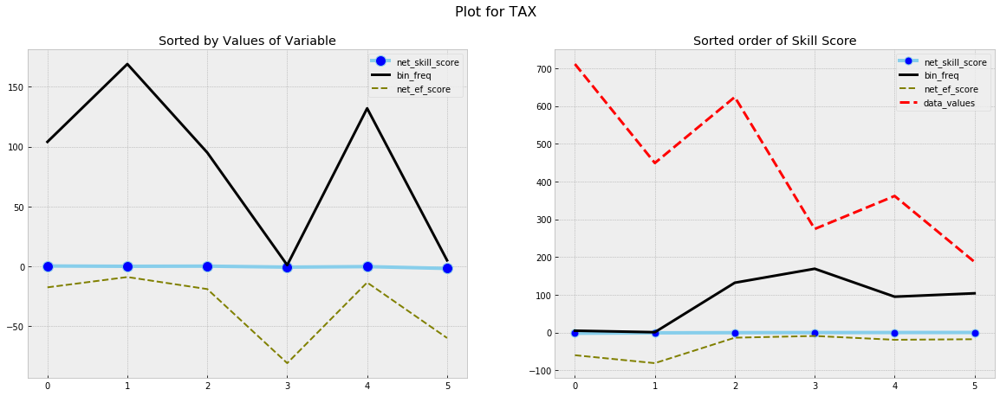

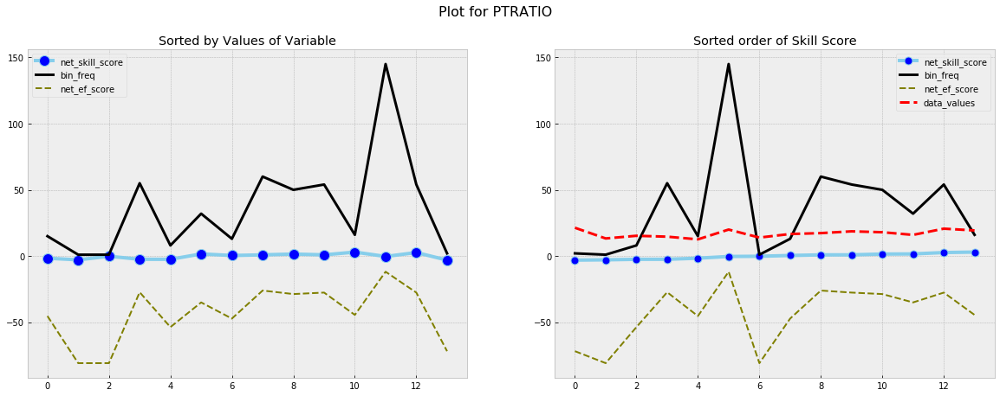

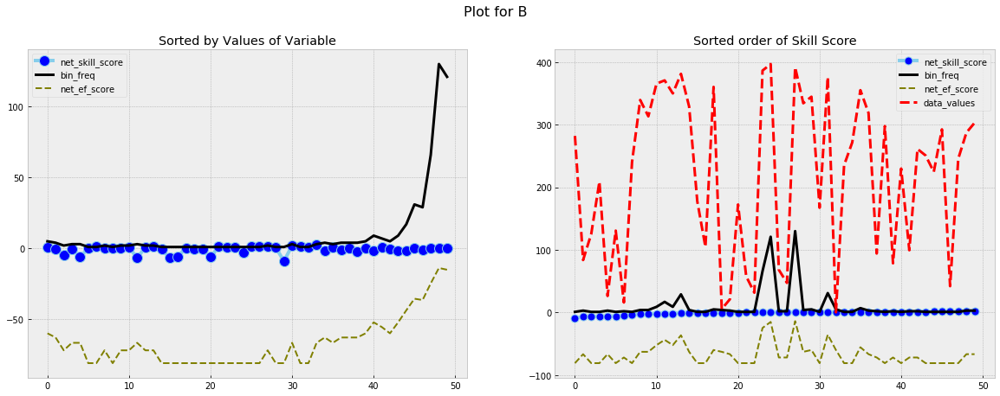

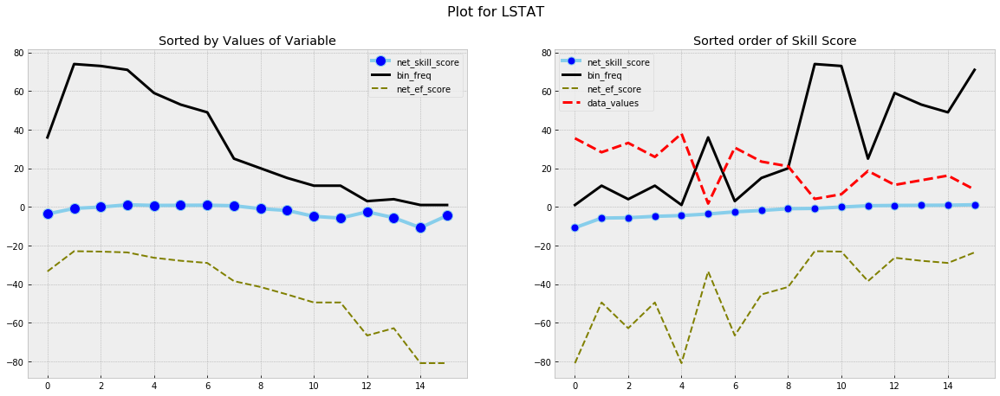

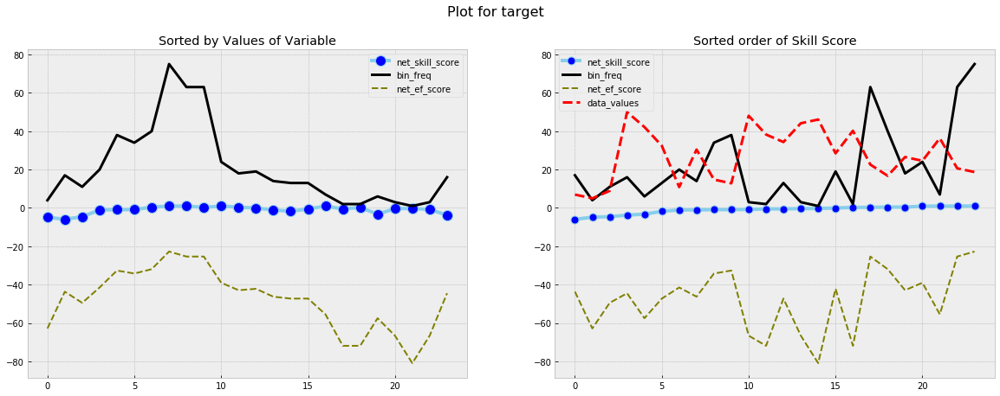

In [24]:
plot_skill_behaviour(df,bins='fd',skill='heidke',verbose=0)

In [48]:
def column_splitter(col_val, col_binner, skill_score, return_array=False, return_true_val=False, return_indexes=False,verbose = 0):    
    split_col = np.digitize(col_val,col_binner)
    bucket_1 = np.unique(split_col)[skill_score > 0]
    bucket_2 = np.unique(split_col)[skill_score <= 0]
    func_1 = np.vectorize(lambda t: np.any(bucket_1 == t))
    func_2 = np.vectorize(lambda t: np.any(bucket_2 == t))
    if return_array:
        return split_col[func_1(split_col)], split_col[func_2(split_col)]
    elif return_true_val:
        return col_val[func_1(split_col)], col_val[func_2(split_col)]
    elif return_indexes:
        return np.where(func_1(split_col))[0], np.where(func_2(split_col))[0] 
    return func_1, func_2

def column_selector_and_splitter(df, skill_eval, selection_criteria = 'max', collect_skill = 'sum',verbose=0):
    
    split_col = None
    col_skill_score = []
    col_ef_score = []
    
    # aggregating skill of each column
    for k,col_skill in enumerate(skill_eval):    
        col_ss = []
        col_ef = []
        for i in col_skill:
            col_ss.append(i[1])
            col_ef.append(i[0])
            
        if collect_skill == 'sum': 
            col_skill_score.append(np.sum(col_ss,axis=0))
            col_ef_score.append(np.sum(col_ef,axis = 0))
        elif collect_skill == 'avg': 
            col_skill_score.append(np.mean(col_ss,axis=0))
            col_ef_score.append(np.mean(col_ef,axis = 0))
        elif collect_skill == 'med': 
            col_skill_score.append(np.median(col_ss,axis=0))
            col_ef_score.append(np.median(col_ef,axis = 0))
        elif collect_skill == 'std': 
            col_skill_score.append(np.std(col_ss,axis=0))
            col_ef_score.append(np.std(col_ef,axis = 0))
        elif collect_skill == 'diff': 
            col_skill_score.append(np.max(col_ss,axis=0)-np.min(col_ss,axis=0))
            col_ef_score.append(np.max(col_ef,axis = 0)-np.min(col_ef,axis = 0))
        else:
            col_skill_score.append(np.sum(col_ss,axis=0))
            col_ef_score.append(np.sum(col_ef,axis = 0))
            
    col_skill_score = np.array(col_skill_score)
    col_ef_score = np.array(col_ef_score)
    
    # finding splitable columns by logic that it should have some negative values and some postitive values
    splitable = np.vectorize(lambda x: (np.max(x) + np.min(x)) < (np.abs(np.max(x)) + np.abs(np.min(x))))    
    splitable = splitable(col_skill_score).tolist()
    
    # selecting the splitting columns based on criteria
    if selection_criteria == 'max':
        cr = [np.max(i) for i in col_skill_score]
        val = np.min(cr)
        for i,c in enumerate(cr):
            if splitable[i] and val <= c:
                val = c
                sel_col = i
        print('Selected Column: {} with max value as :{}'.format(sel_col,cr[sel_col]))
    elif selection_criteria == 'diff':
        cr = [np.max(i)-np.min(i) for i in col_skill_score]
        val = np.min(cr)
        for i,c in enumerate(cr):
            if splitable[i] and val <= c:
                val = c
                sel_col = i
        print('Selected Column: {} with max. variation range value as :{}'.format(sel_col,cr[sel_col]))
    elif selection_criteria == 'mean':
        cr = [np.mean(i) for i in col_skill_score]
        val = np.min(cr)
        for i,c in enumerate(cr):
            if splitable[i] and val <= c:
                val = c
                sel_col = i      
        print('Selected Column: {} with max. mean value as :{}'.format(sel_col,cr[sel_col]))
    elif selection_criteria == 'sum':
        cr = [np.sum(i) for i in col_skill_score]
        val = np.min(cr)
        for i,c in enumerate(cr):
            if splitable[i] and val <= c:
                val = c
                sel_col = i
        print('Selected Column: {} with max. sum value as :{}'.format(sel_col,cr[sel_col]))
    
    if isinstance(df,pd.DataFrame):
        f_1,f_2 = column_splitter(col_val=df.iloc[:,sel_col].values, col_binner=skill_eval[sel_col][0][2],skill_score=col_skill_score[sel_col],return_indexes= True)
        df1 = df.iloc[f_1,:]
        df2 = df.iloc[f_2,:]
    elif isinstance(df,np.ndarray):
        f_1,f_2 = column_splitter(col_val=df[:,sel_col], col_binner=skill_eval[sel_col][0][2],skill_score=col_skill_score[sel_col],return_indexes=True)
        df1 = df[f_1,:]
        df2 = df[f_2,:]
    else:
        raise ValueError('Only pandas dataframe and numpy array is supported right now. Kindly check input!')
    
    return df1, df2, sel_col, cr[sel_col]
        

In [28]:
# column_splitter(col_val=df.iloc[:,2], col_binner=skill_eval[2][0][2], skill_score=col_skill_score[2], return_indexes=True)

In [29]:
# column_selector_and_splitter(df,skill_eval=skill_eval,selection_criteria='max')

In [106]:
class EvidenceTree:
    
    def __init__(self, parent=None, depth=0, selection_criteria='max', skill ='pierce', bins = 'fd', aggregate_skill='sum',
                 collect_skill = 'sum',stopping_criteria = 'evidence', max_depth = 20, keep_na = False, plots=False, verbose = 0):
        
        # basic tree requirements
        self.parent = parent
        self.depth = depth
        self.children = []
        self.value = []
        self.skill_score = []
        self.is_end = False
        
        # behaviour specific requirements
        self.selection_criteria = selection_criteria
        self.skill = skill
        self.bins = bins
        self.aggregate_skill = aggregate_skill
        self.collect_skill = collect_skill
        self.max_depth = max_depth
        self.stopping_criteria = stopping_criteria
        self.keep_na = keep_na
        self.split_col = None
        self.split_val = None
        
        # values to be stored in original data
        self.n_rows = None
        self.n_cols = None
        self.col_names = None
        self.cat_columns = None
        self.num_columns = None
        self.is_pandas = False
        # self.association = None
        # self.classification = None
        # self.estimation = None
        self.similarity = None
        self.evidence = None
        
        #tree generation step specific:
        self.plots = plots
        self.verbose = verbose
        
    def __score_data(self,df):
        # doing whole step on data set in one go
        counters = 0
        cols = [i for i in range(0,df.shape[1])]
        skill_eval = [[] for _ in cols]
        if self.verbose >0:
            print('Number of columns to test: {} '.format(len(skill_eval)))    

        ef_skill = generate_ef_skill(df, bins=self.bins, verbose=self.verbose)
        for i in itertools.combinations(cols, 2):
            eval_p = evaluate_pair(ef_skill=ef_skill, pair=i, skill=self.skill, aggregate_skill=self.aggregate_skill, 
                                   verbose=self.verbose)
            for k,val in enumerate(i):
                skill_eval[val].append(eval_p[k])
                if self.verbose > 2:
                    print('Added evaluation for {}'.format(val))

            counters+=1
        if self.verbose >0:
            print('Number of evaluations :{}'.format(counters))

        self.skill_score = ef_skill
        
        df1, df2, col, val = column_selector_and_splitter(df, skill_eval=skill_eval, collect_skill=self.collect_skill, 
                                                     selection_criteria=self.selection_criteria)
        
        self.value = [df1,df2]
        self.split_col = self.col_names[col] if self.is_pandas else col
        self.split_val = val if isinstance(val,np.number) else 'NA'
    
    def __check_stopping(self, shape, n_row, n_col):
        m,n = shape
        
        # this is hard stopping criteria
        if self.depth > self.max_depth or m < 5 :
            return True
        
        # this is user defined stopping logics
        if self.stopping_criteria == 'evidence':
            return True if m < np.ceil(self.n_rows*0.01) else False
        elif self.stopping_criteria == 'minsize':
            return True if m < 5 else False
        else:
            print('No ohter stopping criteria is defined!')
            return True
        
    
    def split(self, df, n_row, n_col):
        
        if self.__check_stopping(df.shape, n_row, n_col):
            self.value = []
            self.is_end = True
        else:
            self.__score_data(df)
        
    def recursive_splits(self, df, n_row, n_col):
#         print('In rec split depth {} shape {}'.format(self.depth,df.shape))
        self.split(df, n_row, n_col)
        if len(self.value) == 2:
            for i in self.value:
#                 print('In rec split depth {} shape {} stopping criteria {} '.format(self.depth+1, i.shape, self.__check_stopping(i.shape, n_row, n_col)))
                try:
                    if not self.__check_stopping(i.shape, n_row, n_col):
                        new_node = EvidenceTree(self,depth=(self.depth+1),selection_criteria=self.selection_criteria, 
                                                skill =self.skill, bins = self.bins, stopping_criteria = self.stopping_criteria, 
                                                max_depth=self.max_depth, keep_na=self.keep_na,collect_skill=self.collect_skill, 
                                                plots=self.plots, verbose = self.verbose)
                        new_node.n_rows = n_row
                        new_node.n_cols = n_col
                        new_node.col_names = self.col_names
                        new_node.is_pandas = self.is_pandas
                        new_node.recursive_splits(i, n_row, n_col)
                        self.children.append(new_node)
                    else:
                        self.children.append(None) 
                except:
                    self.children.append(None)
        else:
            print('node completed')
            self.is_end = True
        
    def fit(self,data):
        self.n_rows,self.n_cols = data.shape
        
        if isinstance(data, pd.DataFrame):
            self.col_names = data.columns
            self.cat_columns = data.columns[[True if i not in [np.number] else False for i in data.dtypes]]
            self.num_columns = data.columns[[True if i in [np.number] else False for i in data.dtypes]]
            self.is_pandas = True
        elif isinstance(data, list):
            data = np.array(data)
        
        self.recursive_splits(data, self.n_rows, self.n_cols)
    
    def __repr__(self):

        if self.depth == 0:
            spacer = '|~~'
        else:
            spacer = '|  '*(self.depth)+'|~~'
        
        try:
            s = spacer+'Node at depth {} has split on \'{}\' at skill score {:5.4f} with {} children and size: {}\n'.format(
                (self.depth+1),self.split_col,self.split_val,sum([True if i is not None else  False for i in self.children]),
                        [i.shape if i.shape is not () or i is not None else i for i in self.value])
        except:
            try: 
                s = spacer+'Node at depth {} has split on \'{}\' at skill score {:5.4f} with {} children and sizes: NA \n'.format(
                (self.depth+1),self.split_col,self.split_val,sum([True if i is not None else  False for i in self.children]))
            except:
                
                s = spacer+'Node at depth {} has split on NA at skill score NA with NA children and sizes: NA \n'.format(
                (self.depth+1))
                
        for i in self.children:
            if i is not None:
                s += i.__repr__()
        
        return s
    
    def predict(self,X):
        pass
            
    def expand(img, resolution):
        pass

    def collect(self,zoom,axis=0):
        pass
            
    def is_leaf(self):
        """Check if leaf node (i.e. no nodes below this have been expanded)."""
        return sum([True if i is not None else  False for i in self.children]) == 0

    def is_root(self):
        return self.parent is None


In [90]:
df = get_data('boston')
tree = EvidenceTree(bins='fd',skill='doolittle',verbose=0,stopping_criteria="minsize")
tree.fit(df.iloc[:,0:13])

      CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD    TAX  \
0  0.00632  18.0   2.31   0.0  0.538  6.575  65.2  4.0900  1.0  296.0   
1  0.02731   0.0   7.07   0.0  0.469  6.421  78.9  4.9671  2.0  242.0   
2  0.02729   0.0   7.07   0.0  0.469  7.185  61.1  4.9671  2.0  242.0   
3  0.03237   0.0   2.18   0.0  0.458  6.998  45.8  6.0622  3.0  222.0   
4  0.06905   0.0   2.18   0.0  0.458  7.147  54.2  6.0622  3.0  222.0   

   PTRATIO       B  LSTAT  target  
0     15.3  396.90   4.98    24.0  
1     17.8  396.90   9.14    21.6  
2     17.8  392.83   4.03    34.7  
3     18.7  394.63   2.94    33.4  
4     18.7  396.90   5.33    36.2  
             CRIM          ZN       INDUS        CHAS         NOX          RM  \
count  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000   
mean     3.593761   11.363636   11.136779    0.069170    0.554695    6.284634   
std      8.596783   23.322453    6.860353    0.253994    0.115878    0.702617   
min      0.006320    

/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:131: RuntimeWarning: divide by zero encountered in long_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:53: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:62: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:56: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:52: RuntimeWarning: invalid value encountered in absolute


Selected Column: 10 with max value as :1.3361902516664108
Skills to generate :13
Skills to generate :13
Selected Column: 12 with max value as :0.4044786281454041
Skills to generate :13
Selected Column: 10 with max value as :3.055564873743218
Skills to generate :13
Selected Column: 9 with max value as :1.3183835985533103
Skills to generate :13
Selected Column: 3 with max value as :1.4446111096761731
Skills to generate :13
Skills to generate :13
Selected Column: 9 with max value as :2.349653978377341
Skills to generate :13
Selected Column: 0 with max value as :2.3927218840457067
Skills to generate :13
Selected Column: 12 with max value as :1.4649782940053915
Skills to generate :13
Skills to generate :13
Selected Column: 12 with max value as :0.5393048375272054
Skills to generate :13
Selected Column: 5 with max value as :2.2195549439994844
Skills to generate :13
Skills to generate :13
Selected Column: 0 with max value as :1.3918104457836018
Skills to generate :13
Selected Column: 11 with 

In [91]:
tree

|~~Node at depth 1 has split on 'INDUS' at skill score 5.8547 with 2 children and size: [(264, 13), (242, 13)]
|  |~~Node at depth 2 has split on 'INDUS' at skill score 4.6273 with 2 children and size: [(96, 13), (168, 13)]
|  |  |~~Node at depth 3 has split on 'CRIM' at skill score 2.8482 with 2 children and size: [(38, 13), (58, 13)]
|  |  |  |~~Node at depth 4 has split on 'DIS' at skill score 2.0297 with 2 children and size: [(21, 13), (17, 13)]
|  |  |  |  |~~Node at depth 5 has split on 'AGE' at skill score 2.4502 with 1 children and size: [(9, 13), (12, 13)]
|  |  |  |  |  |~~Node at depth 6 has split on 'PTRATIO' at skill score 1.3362 with 1 children and size: [(6, 13), (6, 13)]
|  |  |  |  |  |  |~~Node at depth 7 has split on 'LSTAT' at skill score 0.4045 with 1 children and size: [(1, 13), (5, 13)]
|  |  |  |  |  |  |  |~~Node at depth 8 has split on 'PTRATIO' at skill score 3.0556 with 0 children and size: [(4, 13), (1, 13)]
|  |  |  |  |~~Node at depth 5 has split on 'TAX'

In [107]:
df = get_data('iris')
tree = EvidenceTree(bins=10, skill='heidke',verbose=0)
tree.fit(df.iloc[:,0:4].values)

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                5.1               3.5                1.4               0.2   
1                4.9               3.0                1.4               0.2   
2                4.7               3.2                1.3               0.2   
3                4.6               3.1                1.5               0.2   
4                5.0               3.6                1.4               0.2   

   target  
0       0  
1       0  
2       0  
3       0  
4       0  
       sepal length (cm)  sepal width (cm)  petal length (cm)  \
count         150.000000        150.000000         150.000000   
mean            5.843333          3.054000           3.758667   
std             0.828066          0.433594           1.764420   
min             4.300000          2.000000           1.000000   
25%             5.100000          2.800000           1.600000   
50%             5.800000          3.000000           4.350000  

/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:131: RuntimeWarning: divide by zero encountered in long_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:53: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:62: RuntimeWarning: invalid value encountered in double_scalars
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:73: RuntimeWarning: invalid value encountered in multiply
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:72: RuntimeWarning: invalid value encountered in multiply
/Users/jitins_lab/anaconda2/envs/hyper/lib/python3.6/site-packages/ipykernel/__main__.py:52: R

Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
Skills to generate :4
Selected Column: 3 with max value as :0.0
node completed
Skills to generate :4
Selected Column: 2 with max value as :1.3392606947573142
Skills to generate :4
Selected Column: 1 with max value as :0.3242835332687818
Skills to generate :4
Skills to generate :4
Skills to generate :4
Selected Column: 3 with max value as :0.19735214830912923
Skills to generate :4

In [108]:
tree

|~~Node at depth 1 has split on '1' at skill score 0.7841 with 2 children and size: [(55, 4), (95, 4)]
|  |~~Node at depth 2 has split on '1' at skill score 0.8273 with 2 children and size: [(6, 4), (49, 4)]
|  |  |~~Node at depth 3 has split on '2' at skill score 0.7357 with 0 children and size: [(2, 4), (4, 4)]
|  |  |~~Node at depth 3 has split on '1' at skill score 0.9020 with 2 children and size: [(24, 4), (25, 4)]
|  |  |  |~~Node at depth 4 has split on '3' at skill score 6.3896 with 1 children and size: [(23, 4), (1, 4)]
|  |  |  |  |~~Node at depth 5 has split on '3' at skill score 5.9664 with 1 children and size: [(22, 4), (1, 4)]
|  |  |  |  |  |~~Node at depth 6 has split on '3' at skill score 0.6171 with 2 children and size: [(17, 4), (5, 4)]
|  |  |  |  |  |  |~~Node at depth 7 has split on '2' at skill score 0.4747 with 2 children and size: [(9, 4), (8, 4)]
|  |  |  |  |  |  |  |~~Node at depth 8 has split on '0' at skill score 0.5854 with 1 children and size: [(4, 4), (

In [83]:
df = get_data('cancer')
tree = EvidenceTree(bins='fd', skill='doolittle',verbose=0)
tree.fit(df.iloc[:,0:30])

   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0        17.99         10.38          122.80     1001.0          0.11840   
1        20.57         17.77          132.90     1326.0          0.08474   
2        19.69         21.25          130.00     1203.0          0.10960   
3        11.42         20.38           77.58      386.1          0.14250   
4        20.29         14.34          135.10     1297.0          0.10030   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0           0.27760          0.3001              0.14710         0.2419   
1           0.07864          0.0869              0.07017         0.1812   
2           0.15990          0.1974              0.12790         0.2069   
3           0.28390          0.2414              0.10520         0.2597   
4           0.13280          0.1980              0.10430         0.1809   

   mean fractal dimension   ...    worst texture  worst perimeter  worst area  \
0          

In [84]:
tree

|~~Node at depth 1 has split on 'concave points error' at skill score 17.6032 with 2 children and size: [(316, 30), (253, 30)]
|  |~~Node at depth 2 has split on 'worst perimeter' at skill score 12.1001 with 2 children and size: [(236, 30), (80, 30)]
|  |  |~~Node at depth 3 has split on 'mean concavity' at skill score 6.7593 with 2 children and size: [(143, 30), (93, 30)]
|  |  |  |~~Node at depth 4 has split on 'worst concave points' at skill score 6.7424 with 2 children and size: [(93, 30), (50, 30)]
|  |  |  |  |~~Node at depth 5 has split on 'worst concave points' at skill score 5.0204 with 2 children and size: [(60, 30), (33, 30)]
|  |  |  |  |  |~~Node at depth 6 has split on 'concavity error' at skill score 4.7423 with 1 children and size: [(32, 30), (28, 30)]
|  |  |  |  |  |  |~~Node at depth 7 has split on 'mean smoothness' at skill score 6.9513 with 0 children and size: [(12, 30), (20, 30)]
|  |  |  |  |  |~~Node at depth 6 has split on 'worst perimeter' at skill score 7.18